In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
matplotlib.rcParams["pdf.fonttype"] = 42  
matplotlib.rcParams["ps.fonttype"] = 42 

from pathlib import Path
import numpy as np
import keras
import crested

from helper_functions import *

2025-08-11 11:34:03.051575: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-11 11:34:03.539942: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1754937243.716526  800754 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754937243.767752  800754 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-08-11 11:34:04.197561: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

# Load models, load data

In [2]:
model_path = "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/human/analysis/spc_human/ft/checkpoints/06.keras"
human_model = keras.models.load_model(model_path, compile=False) 

#model_path = "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/macaque/analysis/spc_macaque/ft2/checkpoints/14.keras"
model_path = "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/macaque/analysis/spc_macaque/ft3/checkpoints/05.keras"
macaque_model = keras.models.load_model(model_path, compile=False)  

#model_path = "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/mouse/analysis/spc_mouse/ft/checkpoints/16.keras"
model_path = "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/mouse/analysis/spc_mouse/ft2/checkpoints/24.keras"
mouse_model = keras.models.load_model(model_path, compile=False)  

I0000 00:00:1754937266.395330  800754 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38480 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:b1:00.0, compute capability: 8.0


In [3]:
models = [mouse_model, macaque_model, human_model]

In [4]:
import anndata as ad
adata_macaque_ft = ad.read_h5ad("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/macaque/crested_adata/macaque_spinalcord_hmba_crested_chromsplit_norm_filtered2.h5ad")
output_names_macaque = list(adata_macaque_ft.obs_names)
adata_human_ft = ad.read_h5ad("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/human/crested_adata/human_spinalcord_hmba_crested_chromsplit_norm_filtered.h5ad")
output_names_human = list(adata_human_ft.obs_names)
adata_mouse_ft = ad.read_h5ad("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/mouse/crested_adata/mouse_spinalcord_hmba_crested_chromsplit_norm_filtered.h5ad")
output_names_mouse = list(adata_mouse_ft.obs_names)
adatas_ft = [adata_mouse_ft,adata_macaque_ft,adata_human_ft]


In [5]:
adata_macaque = ad.read_h5ad("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/macaque/crested_adata/macaque_spinalcord_hmba_crested_chromsplit_norm2.h5ad")
output_names_macaque = list(adata_macaque.obs_names)
adata_human= ad.read_h5ad("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/human/crested_adata/human_spinalcord_hmba_crested_chromsplit_norm.h5ad")
output_names_human = list(adata_human.obs_names)
adata_mouse= ad.read_h5ad("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/mouse/crested_adata/mouse_spinalcord_hmba_crested_chromsplit_norm.h5ad")
output_names_mouse = list(adata_mouse.obs_names)

In [6]:
reordered_classes = ["Alpha-MN","Gamma-MN","Gamma_star-MN","Visceral_Motor_Neurons","Cholinergic-IN","Gluta-Dorsal-2","Gluta-Dorsal-3","Gluta-Dorsal-1","Gluta-Dorsal-5","Gluta-Dorsal-7","Gluta-Dorsal-11","Gluta-Dorsal-12",
                     "Gluta-Dorsal-6","Gluta-Dorsal-4","Gluta-Dorsal-8","Gluta-Dorsal-9","Gluta-Dorsal-10","Gluta-V-1","Gluta-M-1","Gluta-M-2","GABA-Dorsal-2","GABA-Dorsal-3","GABA-Dorsal-10","GABA-Dorsal-6",
                     "GABA-Dorsal-4","GABA-Dorsal-8","GABA-Dorsal-7","GABA-Dorsal-9","GABA-Dorsal-5","GABA-Dorsal-1","GABA-M-1","GABA-M-2","GABA-V-1","GABA-V-2","CSF-cNs","GABA-Gluta","Ven-Cap_Endothelial","Meninges",
                     "Pericytes-SM","Ependymal","Oligo-1","Oligo-2","Oligo_Progenitor","OPC","WM_Astrocytes","GM_Astrocytes","Schwann","Lymphocytes","Microglia","Macrophages"]

In [7]:
#predictions = crested.tl.predict(adata_mouse, mouse_model, batch_size=128, verbose=2, genome=genome_mouse)
#adata_mouse.layers["finetuned"] = predictions.T
#predictions = crested.tl.predict(adata_macaque, macaque_model, batch_size=128, verbose=2, genome=genome_macaque)
#adata_macaque.layers["finetuned"] = predictions.T
#predictions = crested.tl.predict(adata_human, human_model, batch_size=128, verbose=2, genome=genome_human)
#adata_human.layers["finetuned"] = predictions.T

In [8]:
#adata_macaque_ft.write("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/macaque/crested_adata/macaque_spinalcord_hmba_crested_chromsplit_norm_filtered2.h5ad")
#adata_human_ft.write("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/human/crested_adata/human_spinalcord_hmba_crested_chromsplit_norm_filtered.h5ad")
#adata_mouse_ft.write("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/mouse/crested_adata/mouse_spinalcord_hmba_crested_chromsplit_norm_filtered.h5ad")

## Set genome (while change anyway depending on species)

In [9]:
# Set the genome
genome_dir = Path("../../../../mouse/biccn/")
genome = crested.Genome("/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/genomes/mouse/fasta/mm10.fa", "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/genomes/mouse/mm10.chrom.sizes")
crested.register_genome(genome)

2025-08-11T11:34:39.134187-0700 INFO Genome mm10 registered.


In [10]:
import pysam
genome_macaque  = "/allen/programs/celltypes/workgroups/rnaseqanalysis/references/macaque/ncbi/mmul10/genome/fasta/genome.fa"
genome_mouse  = "/allen/programs/celltypes/workgroups/rnaseqanalysis/references/mouse/10x/mm10/genome/fasta/genome.fa"
genome_human = "/allen/programs/celltypes/workgroups/rnaseqanalysis/references/human/10x/grch38.p2/genome/fasta/genome.fa"

In [11]:
macaque_chrom_map = load_macaque_chrom_map("mac_chrom.txt")

# Fig. 5B

The goal is here to highlight cross species conservation of enhancer codes.

## Supplement: model performances

In [12]:
#predictions = crested.tl.predict(adata_mouse_ft, mouse_model, batch_size=128, verbose=2, genome=genome_mouse)
#adata_mouse_ft.layers["finetuned"] = predictions.T
#predictions = crested.tl.predict(adata_macaque_ft, macaque_model, batch_size=128, verbose=2, genome=genome_macaque)
#adata_macaque_ft.layers["finetuned"] = predictions.T
#predictions = crested.tl.predict(adata_human_ft, human_model, batch_size=128, verbose=2, genome=genome_human)
#adata_human_ft.layers["finetuned"] = predictions.T

2025-07-11T16:59:13.601880-0700 INFO Plotting density scatter for all targets and predictions, models: ['finetuned'], split: test


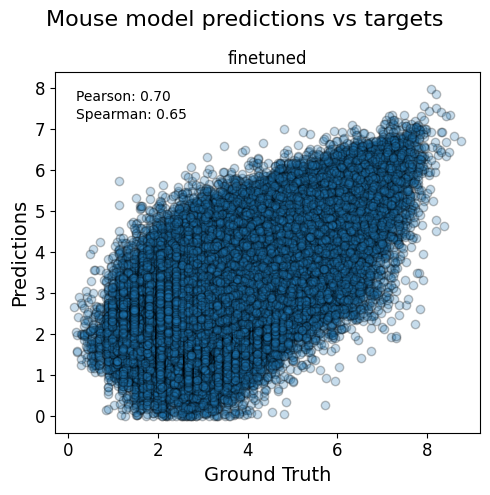

2025-07-11T16:59:14.101649-0700 INFO Plotting density scatter for all targets and predictions, models: ['finetuned'], split: test


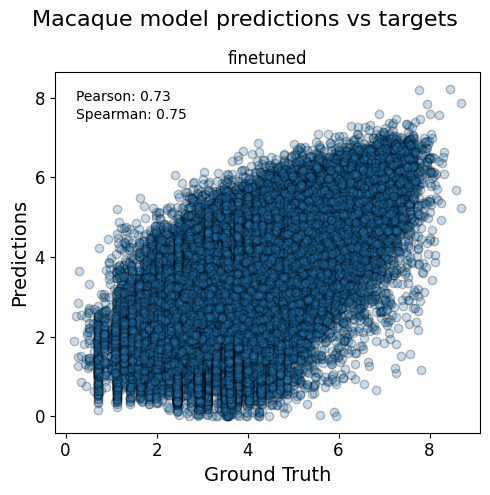

2025-07-11T16:59:14.632727-0700 INFO Plotting density scatter for all targets and predictions, models: ['finetuned'], split: test


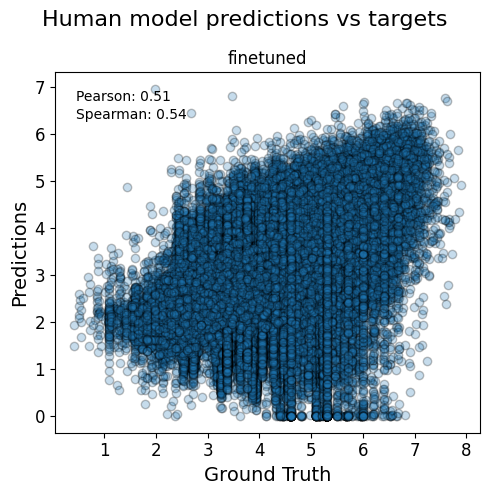

In [13]:
%matplotlib inline
classn = None
species = ['Mouse','Macaque','Human']
adatas_ft = [adata_mouse_ft,adata_macaque_ft,adata_human_ft]
#adatas = [adata_mouse,adata_macaque,adata_human]

for adata_, sp in zip(adatas_ft, species):
    crested.pl.scatter.class_density(
        adata_,
        class_name=classn,
        model_names=["finetuned"],
        split="test",
        log_transform=True,
        width=5,
        height=5,
        title=sp+' model predictions vs targets'
    )


In [14]:
import numpy as np
import anndata as ad

def reorder_adata_classes(
    adata: ad.AnnData,
    current_class_names: list[str],
    desired_order: list[str],
    class_names_key: str = "class_names"
) -> ad.AnnData:
    """
    Reorder rows (classes) of .X and .layers in AnnData to match a desired class order,
    dropping any class not in desired_order, and logging dropped classes.

    Parameters
    ----------
    adata : AnnData
        AnnData object with shape (n_classes, n_features).
    current_class_names : list of str
        Current class names corresponding to rows of .X/.layers/obs_names.
    desired_order : list of str
        Desired row order.
    class_names_key : str
        Key in .uns to store updated class names.

    Returns
    -------
    AnnData
        Updated AnnData object with reordered rows.
    """
    # Build mapping and check overlap
    adata=adata.copy()
    name_to_index = {name: i for i, name in enumerate(current_class_names)}
    reordered_indices = [name_to_index[name] for name in desired_order if name in name_to_index]
    reordered_names = [name for name in desired_order if name in name_to_index]
    dropped_names = [name for name in current_class_names if name not in reordered_names]

    print(f"[INFO] Keeping {len(reordered_names)} / {len(current_class_names)} classes.")
    print(f"[INFO] Dropping {len(dropped_names)} classes: {dropped_names}")

    # Check shape
    if adata.shape[0] != len(current_class_names):
        raise ValueError(
            f"adata has {adata.shape[0]} rows, but current_class_names has {len(current_class_names)} entries."
        )

    # Subset and reorder .X
    if adata.X is not None:
        adata.X = adata.X[reordered_indices, :]
        print(f"[INFO] .X shape after row reorder: {adata.X.shape}")

    # Subset and reorder .layers
    for key in adata.layers:
        layer = adata.layers[key]
        if layer.shape[0] != len(current_class_names):
            raise ValueError(
                f"[ERROR] Layer '{key}' has shape {layer.shape}, expected {len(current_class_names)} rows."
            )
        adata.layers[key] = layer[reordered_indices, :]
        print(f"[INFO] Layer '{key}' shape after reorder: {adata.layers[key].shape}")

    # Reorder obs_names if they are class labels
    if list(adata.obs_names) == current_class_names:
        adata._inplace_subset_obs(reordered_indices)
        adata.obs_names = reordered_names
        print(f"[INFO] Updated obs_names to match reordered classes.")

    # Update .uns
    adata.uns[class_names_key] = reordered_names
    print(f"[INFO] Updated .uns['{class_names_key}'] with {len(reordered_names)} class names.")

    return adata

In [15]:
adatas_ft_sorted = [reorder_adata_classes(adata,current_class_names=list(adata.obs_names),desired_order=reordered_classes) for adata in adatas_ft]

[INFO] Keeping 43 / 43 classes.
[INFO] Dropping 0 classes: []
[INFO] .X shape after row reorder: (43, 140688)
[INFO] Layer 'finetuned' shape after reorder: (43, 140688)
[INFO] Updated obs_names to match reordered classes.
[INFO] Updated .uns['class_names'] with 43 class names.
[INFO] Keeping 48 / 48 classes.
[INFO] Dropping 0 classes: []
[INFO] .X shape after row reorder: (48, 191644)
[INFO] Layer 'finetuned' shape after reorder: (48, 191644)
[INFO] Updated obs_names to match reordered classes.
[INFO] Updated .uns['class_names'] with 48 class names.
[INFO] Keeping 43 / 43 classes.
[INFO] Dropping 0 classes: []
[INFO] .X shape after row reorder: (43, 96362)
[INFO] Layer 'finetuned' shape after reorder: (43, 96362)
[INFO] Updated obs_names to match reordered classes.
[INFO] Updated .uns['class_names'] with 43 class names.


2025-07-11T16:59:15.100754-0700 INFO Plotting heatmap correlations for split: test, models: ['finetuned']


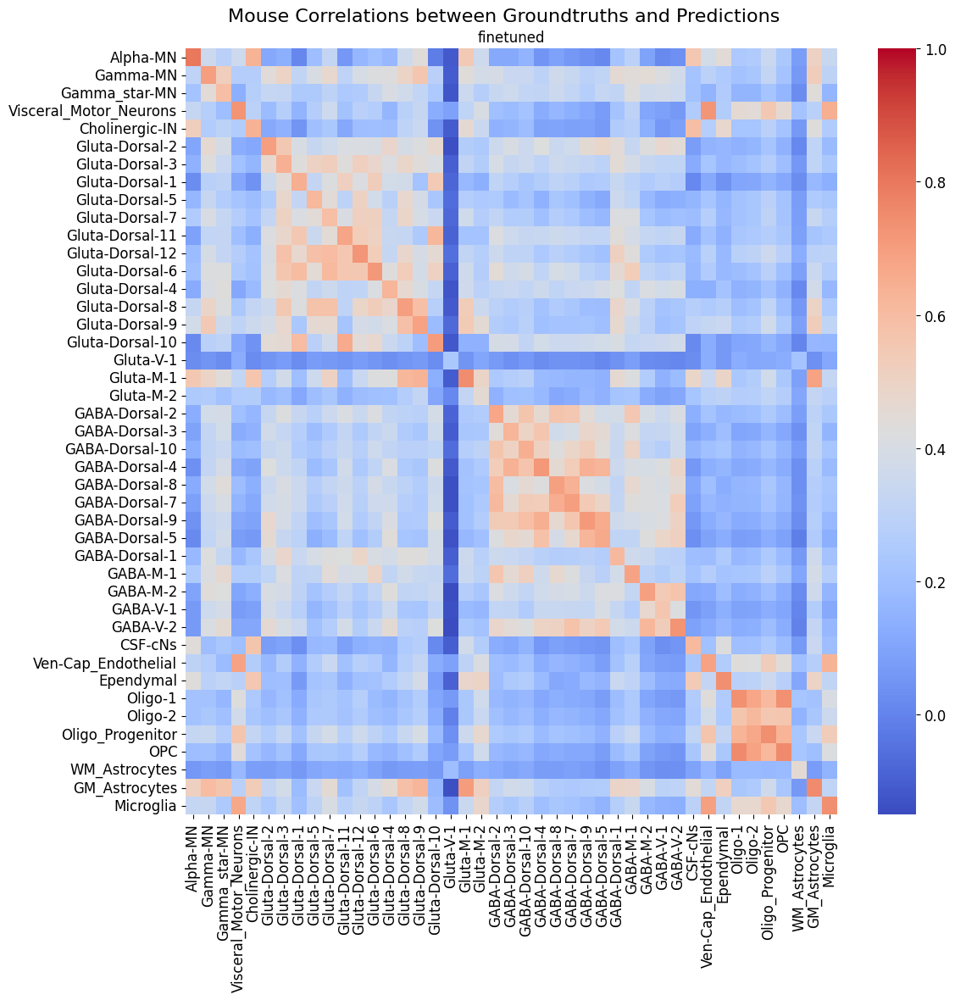

2025-07-11T16:59:15.744884-0700 INFO Plotting heatmap correlations for split: test, models: ['finetuned']


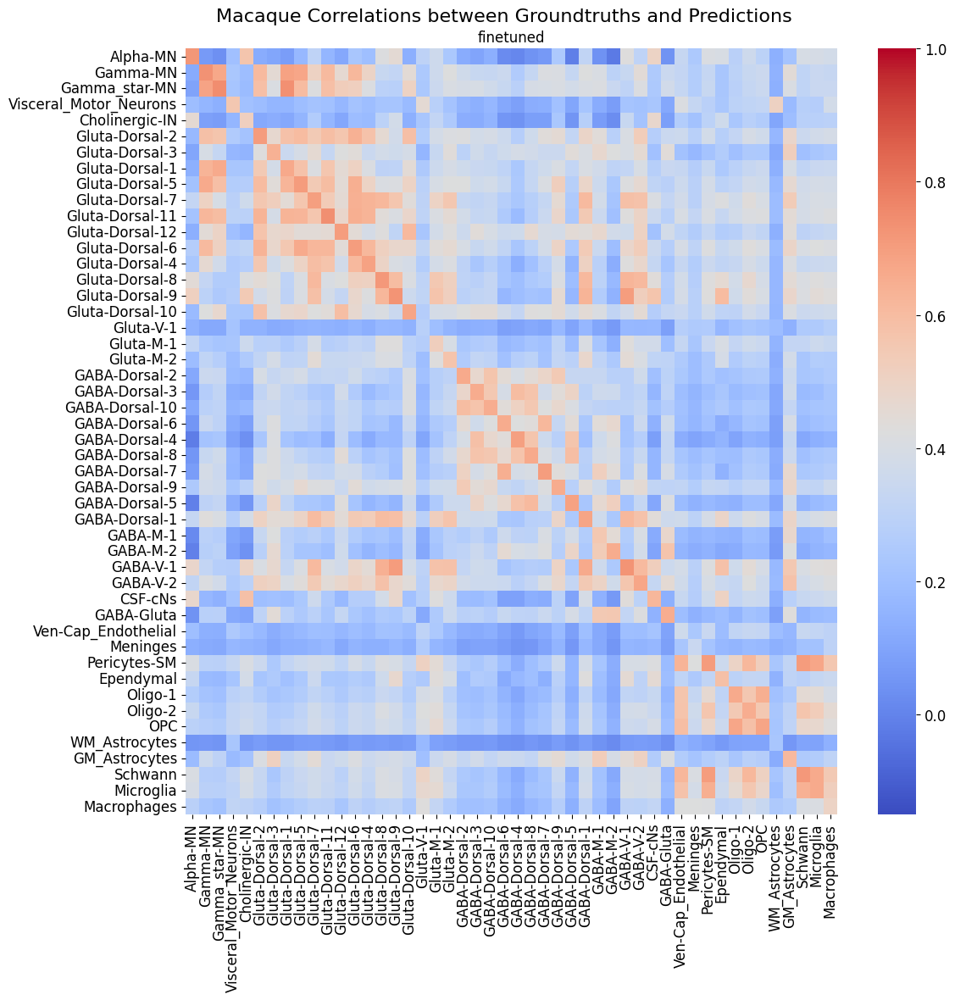

2025-07-11T16:59:16.439806-0700 INFO Plotting heatmap correlations for split: test, models: ['finetuned']


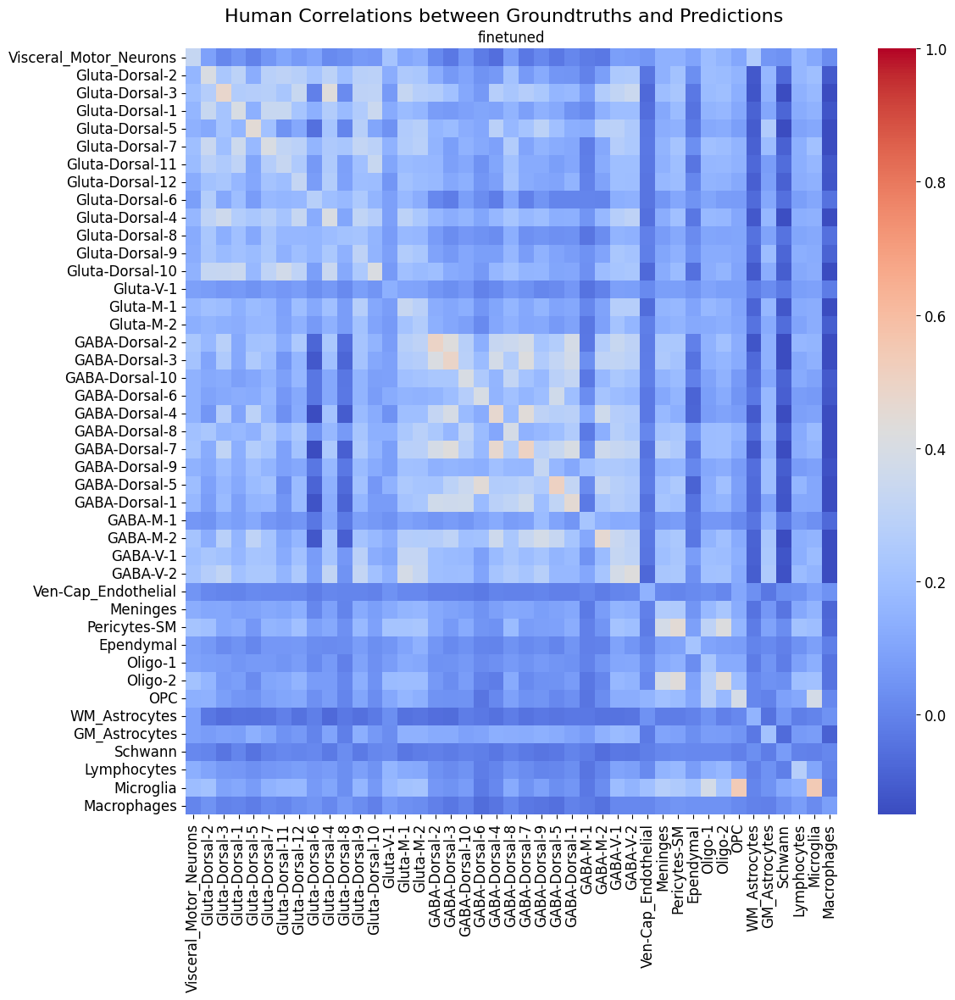

In [16]:
for adata_, sp in zip(adatas_ft_sorted, species):
    crested.pl.heatmap.correlations_predictions(
        adata_,
        split="test",
        title=sp + " Correlations between Groundtruths and Predictions",
        x_label_rotation=90,
        width=12,
        height=12,
        log_transform=True,
        vmax=1,
        vmin=-0.15,
    )

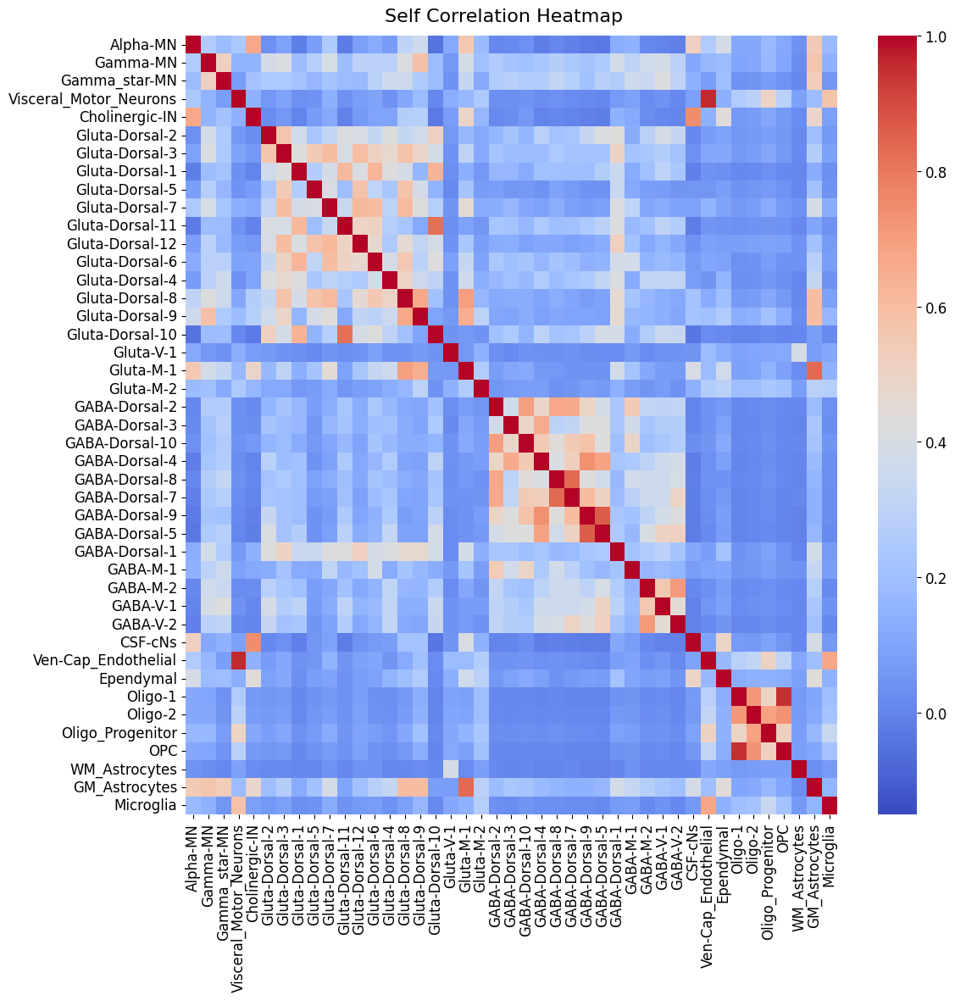

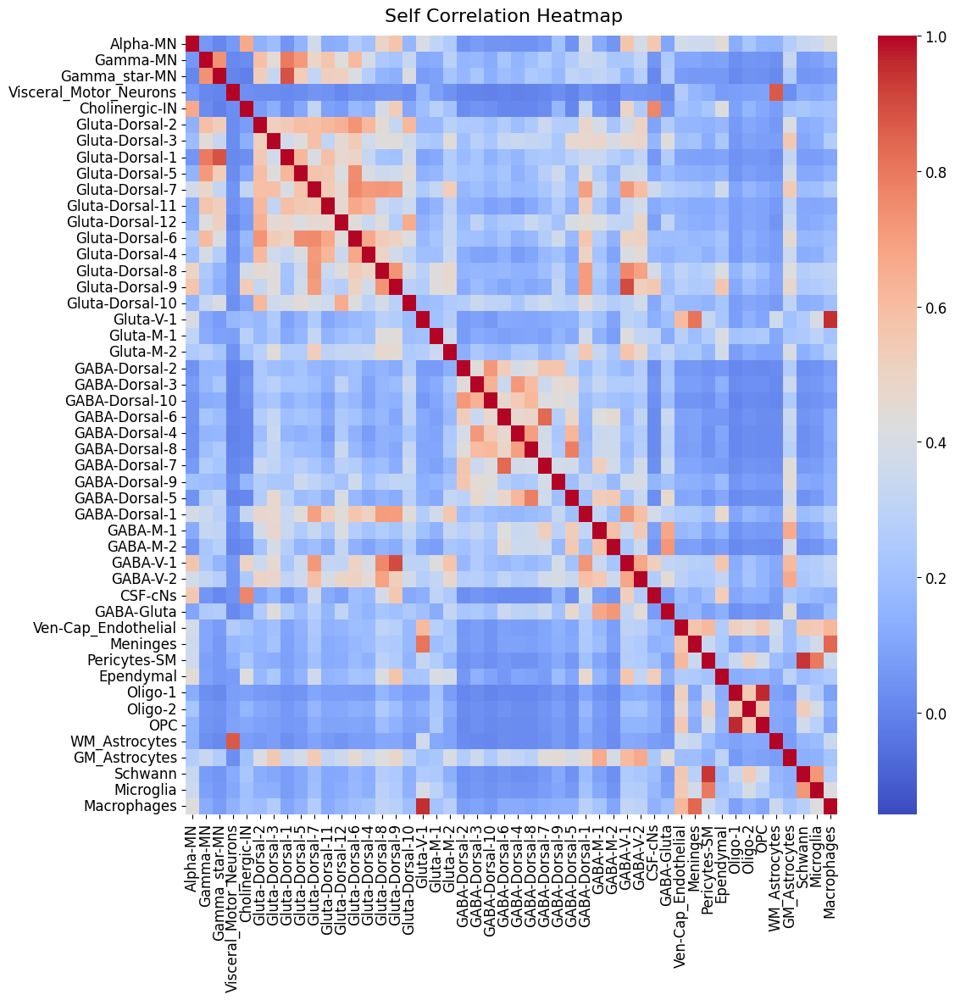

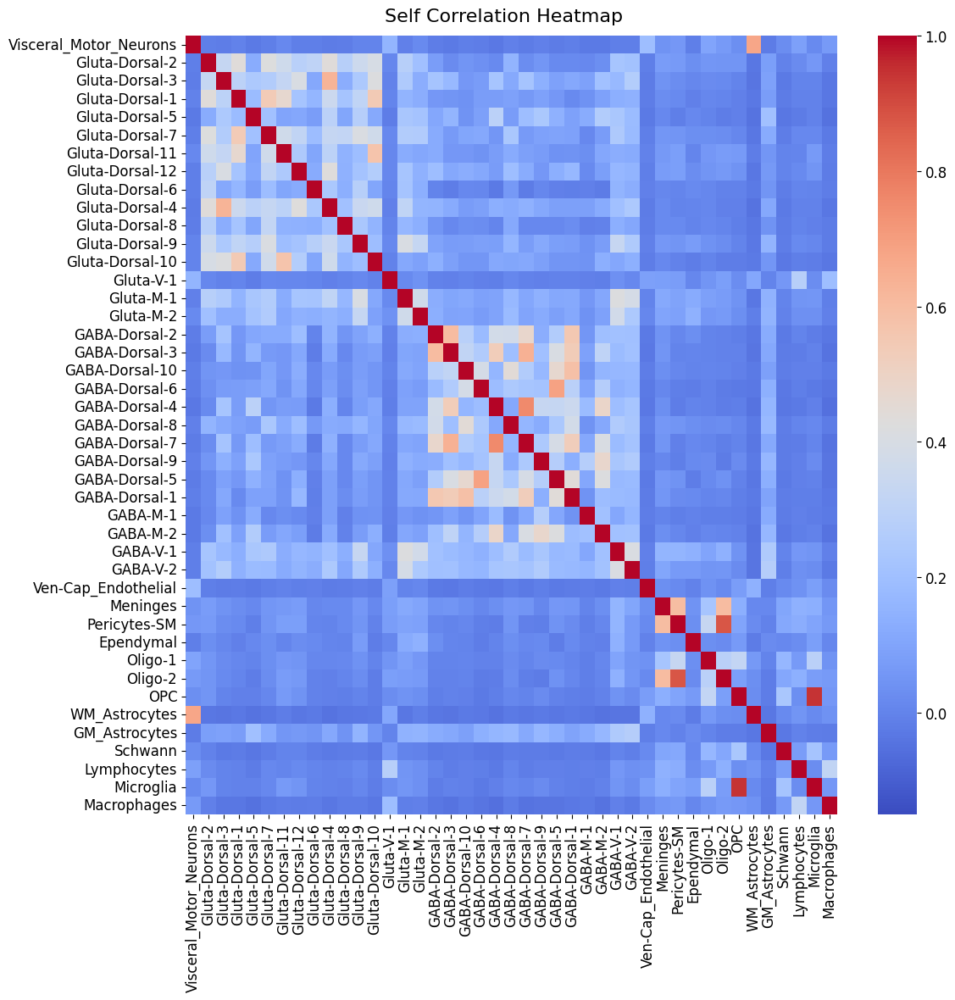

In [17]:
for adata_, sp in zip(adatas_ft_sorted, species):
    crested.pl.heatmap.correlations_self(
    adata_,
    title="Self Correlation Heatmap",
    x_label_rotation=90,
    width=12,
    height=12,
    vmax=1,
    vmin=-0.15,
)

## Region embeddings

In [12]:
adatas = [adata_mouse]#, adata_macaque, adata_human]

In [13]:
adatas_filtered = []

for adata in adatas:
    adata_filtered = adata.copy()
    top_k = 100  # Here we take the top 2k most specific regions, but doing this on top 500 or top 1k will give similar results and will be faster to calculate
    crested.pp.sort_and_filter_regions_on_specificity(
        adata_filtered, top_k=top_k, method="proportion"
    )
    adatas_filtered.append(adata_filtered)

2025-08-04T16:20:17.160486-0700 INFO After sorting and filtering, kept 4300 regions.


/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [14]:
adatas_filtered[0].var

,chr,start,end,split,Class name,rank,proportion_score
region,,,,,,,
chr9:20276796-20278910,chr9,20276796,20278910,train,Alpha-MN,1,0.728923
chr17:22623633-22625747,chr17,22623633,22625747,train,Alpha-MN,2,0.689727
chr17:38797044-38799158,chr17,38797044,38799158,train,Alpha-MN,3,0.685996
chr14:71343597-71345711,chr14,71343597,71345711,train,Alpha-MN,4,0.684448
chr19:7831235-7833349,chr19,7831235,7833349,train,Alpha-MN,5,0.678632
...,...,...,...,...,...,...,...
chr19:55184794-55186908,chr19,55184794,55186908,train,WM_Astrocytes,96,0.301005
chrX:11271089-11273203,chrX,11271089,11273203,train,WM_Astrocytes,97,0.300953
chr9:87504547-87506661,chr9,87504547,87506661,train,WM_Astrocytes,98,0.300921


In [15]:
import pysam
from tqdm import tqdm

seqs_all = []

genomes = [genome_mouse, genome_macaque, genome_human]
for adata, genome in zip(adatas_filtered, genomes):
    fasta = pysam.FastaFile(genome)
    
    seqs = [
        fasta.fetch(chrom, start, end)
        for chrom, start, end in tqdm(zip(adata.var['chr'], adata.var['start'], adata.var['end']))
    ]
    seqs_all.append(seqs)

4300it [00:37, 114.49it/s]


In [16]:
preds = crested.tl.predict(seqs, mouse_model)

I0000 00:00:1754349655.261709 2027558 service.cc:148] XLA service 0x7f3e3400d5f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1754349655.261731 2027558 service.cc:156]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
2025-08-04 16:20:55.281618: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1754349655.349322 2027558 cuda_dnn.cc:529] Loaded cuDNN version 90600
2025-08-04 16:20:56.014958: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 280 bytes spill stores, 280 bytes spill loads

2025-08-04 16:20:56.383009: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 4 bytes sp

 3/34 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

I0000 00:00:1754349675.021992 2027558 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

2025-08-04 16:21:18.045857: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 400 bytes spill stores, 400 bytes spill loads

2025-08-04 16:21:18.187865: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369_0', 116 bytes spill stores, 116 bytes spill loads

2025-08-04 16:21:18.552671: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 44 bytes spill stores, 44 bytes spill loads

2025-08-04 16:21:24.653108: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 186.89GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if mor

34/34 ━━━━━━━━━━━━━━━━━━━━ 37s 523ms/step


In [17]:
embs =  []
for adata_filtered, genome in zip(adatas_filtered, genomes):
    adata_clust = adata_filtered.copy()
    
    emb = crested.tl.extract_layer_embeddings(adata_clust, mouse_model, layer_name='global_average_pooling1d', genome=genome)
    #emb2 = crested.tl.extract_layer_embeddings(adata_clust, macaque_model, layer_name='global_average_pooling1d', genome=genome)
    #emb3 = crested.tl.extract_layer_embeddings(adata_clust, human_model, layer_name='global_average_pooling1d', genome=genome)

    #emb = np.hstack((emb, emb2, emb3))
    print(emb.shape)
    embs.append(emb)

/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step
(4300, 512)


In [18]:
combined = np.vstack(embs)
combined.shape

(4300, 512)

In [19]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

# --- Parameters ---
method = "tsne"  # Choose between "umap" or "tsne"

# --- Normalize embeddings ---
#data = crested.pp._utils._calc_proportion(combined)
data=combined
# --- PCA ---
pca = PCA(n_components=50, random_state=42)
reduced_data = data#pca.fit_transform(data)

# --- Dimensionality reduction ---
if method == "umap":
    reducer = umap.UMAP(random_state=42)
    embedding = reducer.fit_transform(reduced_data)
elif method == "tsne":
    reducer = TSNE(n_components=2, random_state=42, perplexity=30)
    embedding = reducer.fit_transform(reduced_data)
else:
    raise ValueError("Invalid method. Choose 'umap' or 'tsne'.")

# --- Build label & species mappings for all embeddings ---
all_species = []
all_column_names = []

for species_name, adata_clust in zip(['Mouse', 'Macaque', 'Human'], adatas_filtered):
    n_regions = adata_clust.n_vars
    all_species.extend([species_name] * n_regions)
    all_column_names.extend(list(adata_clust.obs_names))  # or var_names if you’re mapping features

assert len(all_species) == embedding.shape[0], "Mismatch between embedding and species labels"

/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [20]:
classes =  {
 'Alpha-MN':'#d70000',
 'Gamma-MN': '#ffa33e',
 'Gamma_star-MN': '#60442a',
 'Visceral_Motor_Neurons': '#ff76a9',
 'Cholinergic-IN': '#8d004a',
 'Gluta-Dorsal-2': '#a700ff',
 'Gluta-Dorsal-3': '#0000f5',
 'Gluta-Dorsal-1': '#8bafff',
 'Gluta-Dorsal-5': '#523a54',
 'Gluta-Dorsal-7': '#f58dff',
 'Gluta-Dorsal-11': '#917a99',
 'Gluta-Dorsal-12': '#4e70c5',
 'Gluta-Dorsal-6': '#5c00af',
 'Gluta-Dorsal-4': '#ddcdfd',
 'Gluta-Dorsal-8': '#ad81f3',
 'Gluta-Dorsal-9': '#324878',
 'Gluta-Dorsal-10': '#89009b',
 'Gluta-V-1': '#e322fd',
 'Gluta-M-1': '#70549b',
 'Gluta-M-2': '#6e2eff',
 'GABA-Dorsal-2': '#008900',
 'GABA-Dorsal-3': '#bfe700',
 'GABA-Dorsal-10': '#02d3a1',
 'GABA-Dorsal-6': '#264a3c',
 'GABA-Dorsal-4': '#97976c',
 'GABA-Dorsal-8': '#5a5800',
 'GABA-Dorsal-7': '#d3d599',
 'GABA-Dorsal-9': '#06c700',
 'GABA-Dorsal-5': '#408168',
 'GABA-Dorsal-1': '#a3a900',
 'GABA-M-1': '#38fb7a',
 'GABA-M-2': '#56a760',
 'GABA-V-1': '#005208',
 'GABA-V-2': '#abe3c9',
 'CSF-cNs': '#768320',
 'GABA-Gluta': '#ffffff',
 'Ven-Cap_Endothelial': '#b94c00',
 'Meninges': '#a9bd00',
 'Pericytes-SM': '#404800',
 'Ependymal': '#ffa978',
 'Oligo-1': '#81855c',
 'Oligo-2': '#682e0c',
 'Oligo_Progenitor': '#d3d99d',
 'OPC': '#c58900',
 'WM_Astrocytes': '#ffbd02',
 'GM_Astrocytes': '#ff6c00',
 'Schwann': '#815a00',
 'Lymphocytes': '#bd896c',
 'Microglia': '#818f00',
 'Macrophages': '#adab66'
}

In [21]:
df = adatas_filtered[0].var[adatas_filtered[0].var['Class name'].isin(['Gluta-Dorsal-11','Gluta-Dorsal-12'])]
df[df['chr']=='chr3']

,chr,start,end,split,Class name,rank,proportion_score
region,,,,,,,
chr3:60935349-60937463,chr3,60935349,60937463,train,Gluta-Dorsal-11,30,0.384162
chr3:15970011-15972125,chr3,15970011,15972125,train,Gluta-Dorsal-11,36,0.381067
chr3:132511781-132513895,chr3,132511781,132513895,train,Gluta-Dorsal-11,49,0.360566
chr3:15958022-15960136,chr3,15958022,15960136,train,Gluta-Dorsal-11,55,0.356418
chr3:52804762-52806876,chr3,52804762,52806876,train,Gluta-Dorsal-11,58,0.355866
chr3:143254356-143256470,chr3,143254356,143256470,train,Gluta-Dorsal-11,92,0.330311
chr3:33907519-33909633,chr3,33907519,33909633,train,Gluta-Dorsal-11,95,0.327755
chr3:106291710-106293824,chr3,106291710,106293824,train,Gluta-Dorsal-12,1,0.625075
chr3:102392110-102394224,chr3,102392110,102394224,train,Gluta-Dorsal-12,3,0.578654


/home/niklas.kempynck/wandb_tmp/ipykernel_2027494/2405941273.py:52: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df: df.nsmallest(top_n_per_class, "rank"))
/home/niklas.kempynck/wandb_tmp/ipykernel_2027494/2405941273.py:93: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(


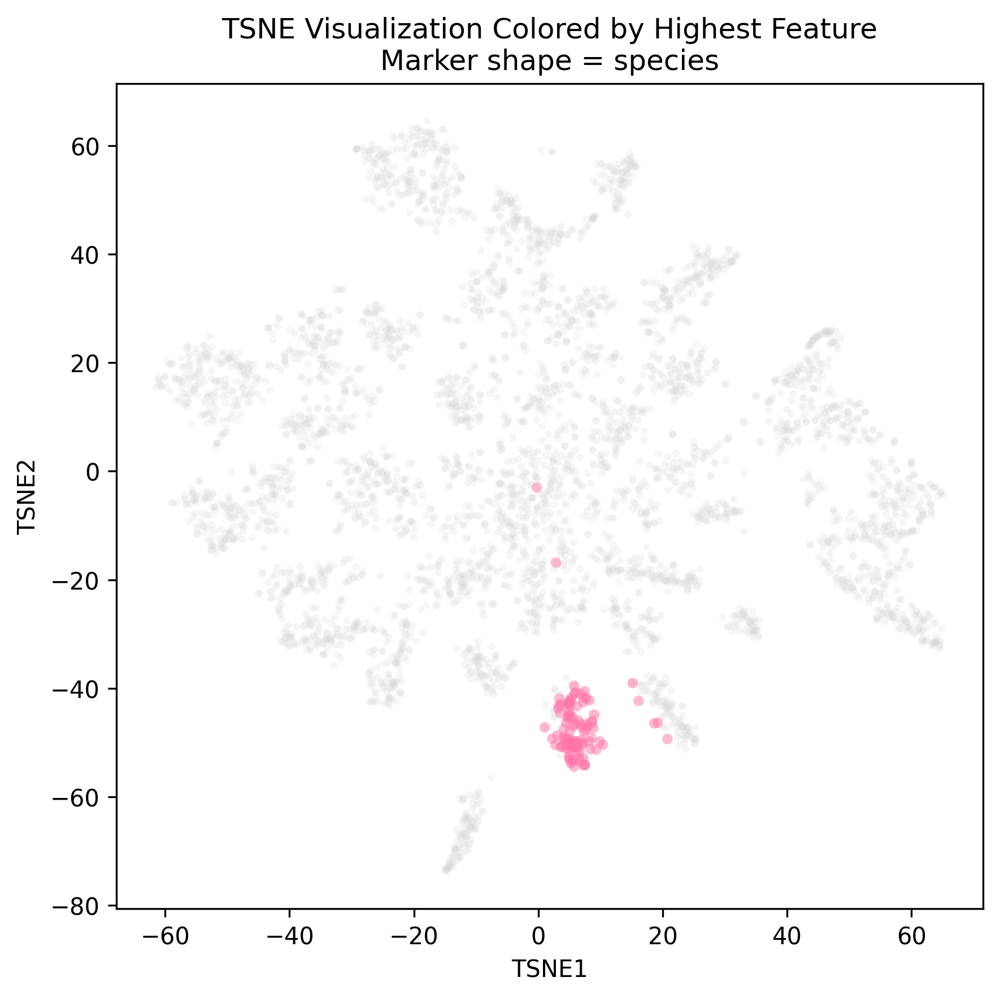

In [116]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# --- Parameters ---
color_by = 'max_peak'
species_names = ['Mouse', 'Macaque', 'Human']
markers = {'Mouse': 'o', 'Macaque': 'x', 'Human': 's'}

# --- Collect values across species ---
all_vals = []
all_species = []

for i, adata_clust in enumerate(adatas_filtered):
    if color_by == 'combined_peak_prediction':
        vals = (adata_clust.X.T + adata_clust.layers['finetuned'].T) / 2
    elif color_by == 'max_prediction':
        vals = adata_clust.layers['finetuned'].T
    elif color_by == 'max_peak':
        vals = adata_clust.X.T
    elif color_by == 'label':
        vals = None
    else:
        raise ValueError(f"Invalid color_by value: {color_by}")

    if color_by == 'label':
        max_column_names = adata_clust.var['Class name'].values
    else:
        max_indices = np.argmax(vals, axis=1)
        max_column_names = [adata_clust.obs_names[idx] for idx in max_indices]

    all_vals.append(max_column_names)
    all_species.extend([species_names[i]] * len(max_column_names))

# --- Flatten lists ---
all_max_columns = np.concatenate(all_vals)
assert len(all_max_columns) == embedding.shape[0]

top_n_per_class = 100

# Map from global index to adata + variable index
subset_indices = []
global_offset = 0

for adata in adatas_filtered:
    var = adata.var.reset_index(drop=True)
    
    # Get the top N indices per class
    top_idx = (
        var.groupby("Class name", group_keys=False)
           .apply(lambda df: df.nsmallest(top_n_per_class, "rank"))
           .index.values
    )

    # Add the global offset for this adata (to map to embedding rows)
    subset_indices.extend(global_offset + top_idx)
    
    # Move offset forward
    global_offset += adata.shape[1]

# Now subset everything to just those embedding rows
embedding_ = embedding[subset_indices].copy()
all_max_columns = all_max_columns[subset_indices]
all_species = np.array(all_species)[subset_indices]

# --- Build DataFrame ---
embedding_df = pd.DataFrame(embedding_, columns=[f"{method.upper()}1", f"{method.upper()}2"])
embedding_df["Highest Feature"] = all_max_columns
embedding_df["Species"] = all_species

# Optional: Filter to classes in dictionary
embedding_df = embedding_df[embedding_df["Highest Feature"].isin(classes.keys())]
# --- Shuffle rows randomly before plotting ---
embedding_df = embedding_df.sample(frac=1, random_state=42).reset_index(drop=True)

# --- Plotting ---
plt.figure(figsize=(6, 6), dpi=300)
already_plotted = set()

#selected_species = ['Mouse']#, 'Macaque', 'Human']  # e.g. choose one or two: 'Mouse', 'Macaque', 'Human'
#embedding_df = embedding_df[embedding_df["Species"].isin(selected_species)]

selected_classes = ['Visc']  
pattern = '|'.join(selected_classes)  # e.g. "GABA|Gluta"
embedding_df["Selected"] = embedding_df["Highest Feature"].str.contains(pattern)

# Plot non-selected points in grey (background)
df_non_selected = embedding_df[~embedding_df["Selected"]]
for species in species_names:
    marker = markers[species]
    df_species = df_non_selected[df_non_selected["Species"] == species]
    plt.scatter(
        df_species[f"{method.upper()}1"],
        df_species[f"{method.upper()}2"],
        color='lightgrey',
        alpha=0.2,
        s=10,
        marker=marker,
        rasterized=True,
        label=None,
        edgecolor='none' if marker != 'x' else 'black'
    )

df_selected = embedding_df[embedding_df["Selected"]]

for species in species_names:
    marker = markers[species]
    df_species = df_selected[df_selected["Species"] == species]

    for feature in classes:
        subset = df_species[df_species["Highest Feature"] == feature]
        if not subset.empty:
            plt.scatter(
                subset[f"{method.upper()}1"],
                subset[f"{method.upper()}2"],
                marker=marker,
                color=classes[feature],
                label=feature if feature not in already_plotted else None,
                alpha=0.5,
                rasterized=True,
                s=20,
                edgecolor='none' if marker != 'x' else 'black'
            )
            already_plotted.add(feature)

plt.title(f"{method.upper()} Visualization Colored by Highest Feature\nMarker shape = species")
plt.xlabel(f"{method.upper()}1")
plt.ylabel(f"{method.upper()}2")
#plt.legend(markerscale=2, bbox_to_anchor=(1.05, 1), loc='upper left', title="Feature (ordered)", ncol=1)
plt.tight_layout()
#plt.savefig('seq_tsne_combined_top100.pdf', bbox_inches='tight')

plt.show()

In [102]:
embedding_df

,TSNE1,TSNE2,Highest Feature,Species,Selected
0,59.937611,1.538859,GM_Astrocytes,Mouse,False
1,-39.891933,-30.613892,Gluta-Dorsal-8,Mouse,False
2,9.129807,-6.048816,Gamma_star-MN,Mouse,False
3,-9.461621,10.362842,GABA-Dorsal-8,Mouse,False
4,32.781948,-26.251078,CSF-cNs,Mouse,False
...,...,...,...,...,...
4295,-4.574167,-21.243782,Gluta-V-1,Mouse,False
4296,-9.801230,31.950954,GABA-Dorsal-1,Mouse,False
4297,-26.975529,-42.456715,Gluta-Dorsal-8,Mouse,False
4298,54.551098,-18.314510,Oligo-1,Mouse,False


#### Highlighted regions

In [120]:
# --- Parameters ---
selected_species = ['Mouse']
selected_classes = ['Visceral_Motor_Neurons']  # exact match or substrings
top_n_per_class = 100

# --- Build filtered embedding + var + species ---
subset_indices = []
filtered_adatas = []
filtered_species = []

# This will collect the rows from embedding in the same order
adata_embedding_index = 0
embedding_slices = []

for species_name, adata in zip(species_names, adatas_filtered):
    if species_name not in selected_species:
        adata_embedding_index += adata.shape[1]
        continue

    var = adata.var.reset_index(drop=True)

    # Filter to selected class names (substring match)
    pattern = '|'.join(selected_classes)
    class_mask = var['Class name'].str.contains(pattern, regex=True, na=False)
    var_filtered = var[class_mask].copy()

    # Top-N per class
    top_idx = (
        var_filtered
        .groupby("Class name", group_keys=False)
        .apply(lambda df: df.nsmallest(top_n_per_class, "rank"))
        .index.values
    )

    # Keep adata subset and embedding index range
    filtered_adatas.append(adata[:, top_idx].copy())
    filtered_species.extend([species_name] * len(top_idx))
    embedding_slices.extend(range(adata_embedding_index, adata_embedding_index + adata.shape[1])[i] for i in top_idx)

    adata_embedding_index += adata.shape[1]

# Final filtered embedding and var
embedding_ = embedding[embedding_slices]
var_all_filtered = pd.concat([a.var for a in filtered_adatas], axis=0, ignore_index=True)
all_species = np.array(filtered_species)
# --- Outer region extraction function ---
def get_outermost_genomic_regions_filtered(embedding, var_all_filtered, k=1):
    """
    Get genomic regions corresponding to the k most extreme embedding values per axis,
    using a filtered embedding and corresponding var dataframe.
    """
    max_x_idx = np.argsort(embedding[:, 0])[-k:]
    min_x_idx = np.argsort(embedding[:, 0])[:k]
    max_y_idx = np.argsort(embedding[:, 1])[-k:]
    min_y_idx = np.argsort(embedding[:, 1])[:k]

    outer_indices = np.unique(np.concatenate([max_x_idx, min_x_idx, max_y_idx, min_y_idx]))
    outer_genomic_regions = var_all_filtered.iloc[outer_indices][['chr', 'start', 'end']].copy()

    return outer_indices, outer_genomic_regions

# --- Get outermost regions ---
outer_indices, outer_genomic_regions = get_outermost_genomic_regions_filtered(embedding_, var_all_filtered, k=2)

/home/niklas.kempynck/wandb_tmp/ipykernel_2027494/1127831763.py:31: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df: df.nsmallest(top_n_per_class, "rank"))


In [121]:
outer_genomic_regions

,chr,start,end
19,chr7,81181920,81184034
37,chr15,74832699,74834813
48,chr16,30849587,30851701
54,chr2,17994127,17996241
60,chr18,19551004,19553118
66,chr19,54116699,54118813
87,chr4,26799953,26802067


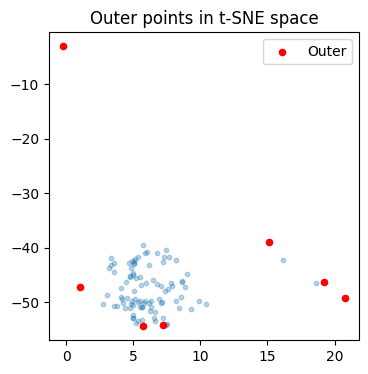

In [122]:
plt.figure(figsize=(4, 4))
plt.scatter(embedding_[:, 0], embedding_[:, 1], alpha=0.3, s=10)
plt.scatter(embedding_[outer_indices, 0], embedding_[outer_indices, 1], color='red', s=20, label='Outer')
plt.legend()
plt.title("Outer points in t-SNE space")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


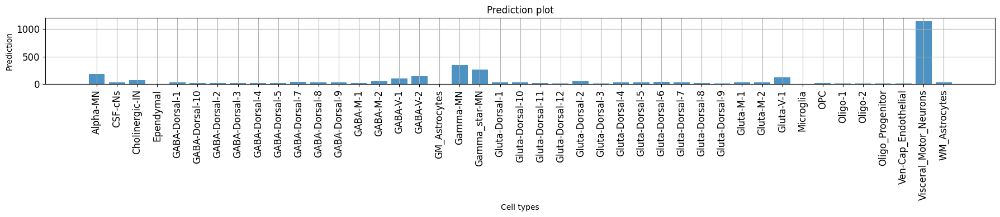

2025-08-04T17:25:43.022741-0700 INFO Calculating contribution scores for 1 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:00<00:00,  9.57it/s]


In [127]:
idx=5
seq = pysam.FastaFile(genome_mouse).fetch(outer_genomic_regions.iloc[idx]['chr'],int(outer_genomic_regions.iloc[idx]['start']),int(outer_genomic_regions.iloc[idx]['end']))
pred = crested.tl.predict(seq, mouse_model)[0]
crested.pl.bar.prediction(pred, classes=list(adata_mouse.obs_names), x_label_rotation=90, height=4)
cl_idx = np.flip(np.argsort(pred))[0]

regions_of_interest=[seq]
scores, one_hot_encoded_sequences = crested.tl.contribution_scores(
    regions_of_interest,
    target_idx=[cl_idx],
    model=mouse_model,
    method='integrated_grad'
)

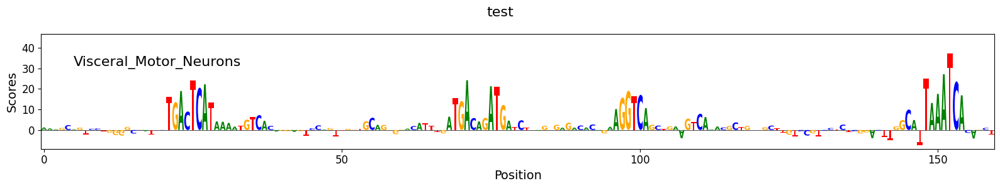

In [128]:
crested.pl.patterns.contribution_scores(
    scores,
    one_hot_encoded_sequences,
    sequence_labels=[""],
    class_labels=[np.array(adata_mouse.obs_names)[cl_idx]],
    zoom_n_bases=160,
    title="test",
    height=3,
    save_path="region.pdf"
)  # zoom in on the center 500bp

### Insert own region

In [245]:
chrom="chr3"
start=135176539-734
end=135177184+735
seq = pysam.FastaFile(genome_mouse).fetch(chrom,start,end)
seq_emb = crested.tl.extract_layer_embeddings(seq, mouse_model, layer_name='global_average_pooling1d', genome=genome_mouse)
seq_embedding = reducer.transform(seq_emb)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 710ms/step


AttributeError: 'TSNE' object has no attribute 'transform'

In [246]:
embedding_df

,TSNE1,TSNE2,Highest Feature,Species
3,-9.321945,10.428044,GABA-Dorsal-8,Mouse
7,-28.387419,59.534115,GABA-Dorsal-10,Mouse
8,23.799126,32.328747,GABA-Dorsal-5,Mouse
14,18.726566,0.520715,GABA-Dorsal-1,Mouse
15,-8.030621,-15.312421,GABA-Dorsal-7,Mouse
...,...,...,...,...
4283,-9.628711,31.305759,GABA-Dorsal-1,Mouse
4287,-12.977297,17.227308,GABA-Dorsal-8,Mouse
4290,-23.939299,54.556049,GABA-Dorsal-3,Mouse
4296,-9.671102,32.072552,GABA-Dorsal-1,Mouse


# Top region scores

In [18]:
from tqdm import tqdm

top_k = 500  # Here we take the top 2k most specific regions, but doing this on top 500 or top 1k will give similar results and will be faster to calculate

cross_preds_mouse = {}
cross_preds_macaque = {}
cross_preds_human = {}

cross_preds = [cross_preds_mouse, cross_preds_macaque, cross_preds_human]

peak_values = {}

genomes = [pysam.FastaFile(genome_mouse),pysam.FastaFile(genome_macaque),pysam.FastaFile(genome_human)]

for adata_, sp, genome in zip(adatas_ft, species, genomes):
    adata_filtered = adata_.copy()
    crested.pp.sort_and_filter_regions_on_specificity(
        adata_filtered, top_k=top_k, method="proportion"
    )
    seqs = [genome.fetch(chrom, start, end).upper() for chrom, start, end in tqdm(zip(adata_filtered.var['chr'], adata_filtered.var['start'], adata_filtered.var['end']))]

    for model, cr_preds in zip(models, cross_preds):
        cr_preds[sp] = {}
        peak_values[sp] = {}
        preds = crested.tl.predict(seqs, model)
        multiplier = 0
        for cls in list(adata_filtered.obs_names):
            cr_preds[sp][cls] = preds[multiplier*top_k:(multiplier+1)*top_k]
            peak_values[sp] = adata_filtered.X.T[multiplier*top_k:(multiplier+1)*top_k]
            multiplier+=1



2025-07-11T16:59:19.321157-0700 INFO After sorting and filtering, kept 21500 regions.


/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
21500it [00:00, 73529.98it/s]
I0000 00:00:1752278360.895519 2229623 service.cc:148] XLA service 0x7f128800d610 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1752278360.895541 2229623 service.cc:156]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
2025-07-11 16:59:20.915781: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1752278360.984442 2229623 cuda_dnn.cc:529] Loaded cuDNN version 90600
2025-07-11 16:59:21.670457: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in f

  3/168 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

I0000 00:00:1752278380.657225 2229623 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


167/168 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

2025-07-11 16:59:51.811915: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 400 bytes spill stores, 400 bytes spill loads

2025-07-11 16:59:51.971828: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369_0', 116 bytes spill stores, 116 bytes spill loads

2025-07-11 16:59:52.159111: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 44 bytes spill stores, 44 bytes spill loads

2025-07-11 16:59:54.590188: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[248,512,1,1055]{3,2,1,0}, u8[0]{0}) custom-call(f32[248,512,1,1057]{3,2,1,0}, f32[512,512,1,3]{3,2,1,0}), window={size=1x3}, dim_labels=bf01_oi01->bf01, custom_call_

168/168 ━━━━━━━━━━━━━━━━━━━━ 51s 184ms/step
168/168 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step
168/168 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step
2025-07-11T17:00:40.317260-0700 INFO After sorting and filtering, kept 24000 regions.


/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
24000it [00:00, 70417.06it/s]


187/188 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

2025-07-11 17:00:53.875841: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 4 bytes spill stores, 4 bytes spill loads

2025-07-11 17:00:53.992359: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 280 bytes spill stores, 280 bytes spill loads

2025-07-11 17:00:59.554952: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 162.52GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


188/188 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step
188/188 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step
188/188 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step
2025-07-11T17:01:32.838570-0700 INFO After sorting and filtering, kept 21500 regions.


/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
21500it [00:00, 71151.99it/s]


168/168 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step
168/168 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step
168/168 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step


In [19]:
from scipy.stats import spearmanr, pearsonr
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

def compute_multi_correlation_matrices(cross_preds_a, cross_preds_b, 
                                       adata_a, adata_b, 
                                       species_key1='Mouse', 
                                       species_key2='Macaque',
                                       method='spearman', 
                                       log_transform=True,
                                       axis=1):
    """
    Computes three correlation matrices:
    - One for species_key1
    - One for species_key2
    - One for all classes combined across both species

    Parameters
    ----------
    cross_preds_a, cross_preds_b : dict
        Dictionaries of predictions for dataset A and B.
    adata_a, adata_b : AnnData
        AnnData objects with .obs_names to infer shape.
    species_key1, species_key2 : str
        The species keys to extract predictions.
    method : str
        'spearman' or 'pearson'.
    log_transform : bool
        Apply log1p transform to prediction values.
    axis : int
        Whether to extract correlations across columns (1) or rows (0).

    Returns
    -------
    dict of np.ndarray
        Dictionary with keys 'species1', 'species2', and 'combined' for the 3 correlation matrices.
    """
    def get_matrix(preds_a, preds_b, labels_a, labels_b, classes_a, classes_b):
        n_a, n_b = len(classes_a), len(classes_b)
        matrix = np.zeros((n_a, n_b))

        all_vals = np.zeros((len(classes_a), len(classes_b),2, 500)) ## FIX HARDCODING

        for i, cls_a in enumerate(preds_a):
            vals_a = preds_a[cls_a]
            vals_a = vals_a[:, i]
            
            if log_transform:
                vals_a = np.log1p(vals_a)

            for j, _ in enumerate(classes_b):
                vals_b = preds_b[cls_a]
                vals_b = vals_b[:, j]
                
                if log_transform:
                    vals_b = np.log1p(vals_b)

                if method == 'spearman':
                    corr, _ = spearmanr(vals_a, vals_b)
                else:
                    corr, _ = pearsonr(vals_a, vals_b)
                matrix[i, j] = corr
                all_vals[i,j,0] = vals_a
                all_vals[i,j,1] = vals_b

        return matrix, all_vals
    
    preds1_a = cross_preds_a[species_key1]
    preds1_b = cross_preds_b[species_key1]
    corr1, all_vals_a = get_matrix(preds1_a, preds1_b, preds1_a.keys(), preds1_b.keys(), list(adata_a.obs_names), list(adata_b.obs_names))

    preds2_a = cross_preds_a[species_key2]
    preds2_b = cross_preds_b[species_key2]
    corr2, all_vals_b = get_matrix(preds2_b, preds2_a, preds2_b.keys(), preds2_a.keys(), list(adata_b.obs_names), list(adata_a.obs_names))

    n_a, n_b = len(list(adata_a.obs_names)), len(list(adata_b.obs_names))
    matrix = np.zeros((n_a, n_b))
    
    for i in range(n_a):
        for j in range(n_b):
            vals_a = np.concatenate((all_vals_a[i,j,0], all_vals_b[j,i,1]))
            vals_b = np.concatenate((all_vals_a[i,j,1], all_vals_b[j,i,0]))
            if method == 'spearman':
                corr, _ = spearmanr(vals_a, vals_b)
            else:
                corr, _ = pearsonr(vals_a, vals_b)
            matrix[i, j] = corr
            
    

    return {
        'species1': corr1,
        'species2': corr2,
        'combined': matrix
    }


def plot_correlation_heatmap(corr_matrix, y_labels, x_labels, species_pair, figsize=(12, 12), cmap='coolwarm'):
    """
    Plots a heatmap of the correlation matrix.

    Parameters
    ----------
    corr_matrix : np.ndarray
        The correlation matrix to visualize.
    species_key : str
        Key to access the correct species in both prediction dicts.
    figsize : tuple
        Size of the figure.
    cmap : str
        Colormap to use for the heatmap.
    """
    plt.figure(figsize=figsize)
    sns.heatmap(corr_matrix, xticklabels=x_labels, yticklabels=y_labels, cmap=cmap, annot=False, fmt=".2f")
    plt.xlabel(f'Predictions from {species_pair[1]}')
    plt.ylabel(f'Predictions from {species_pair[0]}')
    plt.title('Cross-prediction Correlation')
    plt.tight_layout()
    plt.show()

In [20]:
import numpy as np

def compare_species_correlations(species_pair, reordered_classes, species_data, method='pearson'):
    """
    Compute and plot reordered correlation heatmap between two species' predictions.

    Parameters
    ----------
    species_pair : list of str
        Two species names, e.g. ['Mouse', 'Macaque'].
    reordered_classes : list of str
        Desired order of classes to plot.
    species_data : dict
        Dictionary with keys 'Mouse', 'Macaque', 'Human', each mapping to:
            {
                'cross_preds': ...,
                'adata': ...
            }
    method : str
        'pearson' or 'spearman'
    """
    cp_a = species_data[species_pair[0]]['cross_preds']
    cp_b = species_data[species_pair[1]]['cross_preds']
    adata_a = species_data[species_pair[0]]['adata']
    adata_b = species_data[species_pair[1]]['adata']

    corrs = compute_multi_correlation_matrices(
        cp_a, cp_b,
        adata_a, adata_b,
        species_key1=species_pair[0],
        species_key2=species_pair[1],
        method=method
    )

    corr_a = corrs['species1']
    corr_b = corrs['species2']
    corr_combined = corrs['combined']  # 2D array

    obs_names_a = list(adata_a.obs_names)
    obs_names_b = list(adata_b.obs_names)

    index_order_a = [obs_names_a.index(cls) for cls in reordered_classes if cls in obs_names_a]
    index_order_b = [obs_names_b.index(cls) for cls in reordered_classes if cls in obs_names_b]

    reordered_obs_names_a = [obs_names_a[i] for i in index_order_a]
    reordered_obs_names_b = [obs_names_b[i] for i in index_order_b]

    # Slice all correlation matrices
    corr_a = corr_a[np.ix_(index_order_a, index_order_b)]
    corr_b = corr_b[np.ix_(index_order_b, index_order_a)]
    corr_combined = corr_combined[np.ix_(index_order_a, index_order_b)]

    # Plot
    plot_correlation_heatmap(corr_combined, reordered_obs_names_a, reordered_obs_names_b, species_pair)
    return corr_a, corr_b, corr_combined, reordered_obs_names_a, reordered_obs_names_b

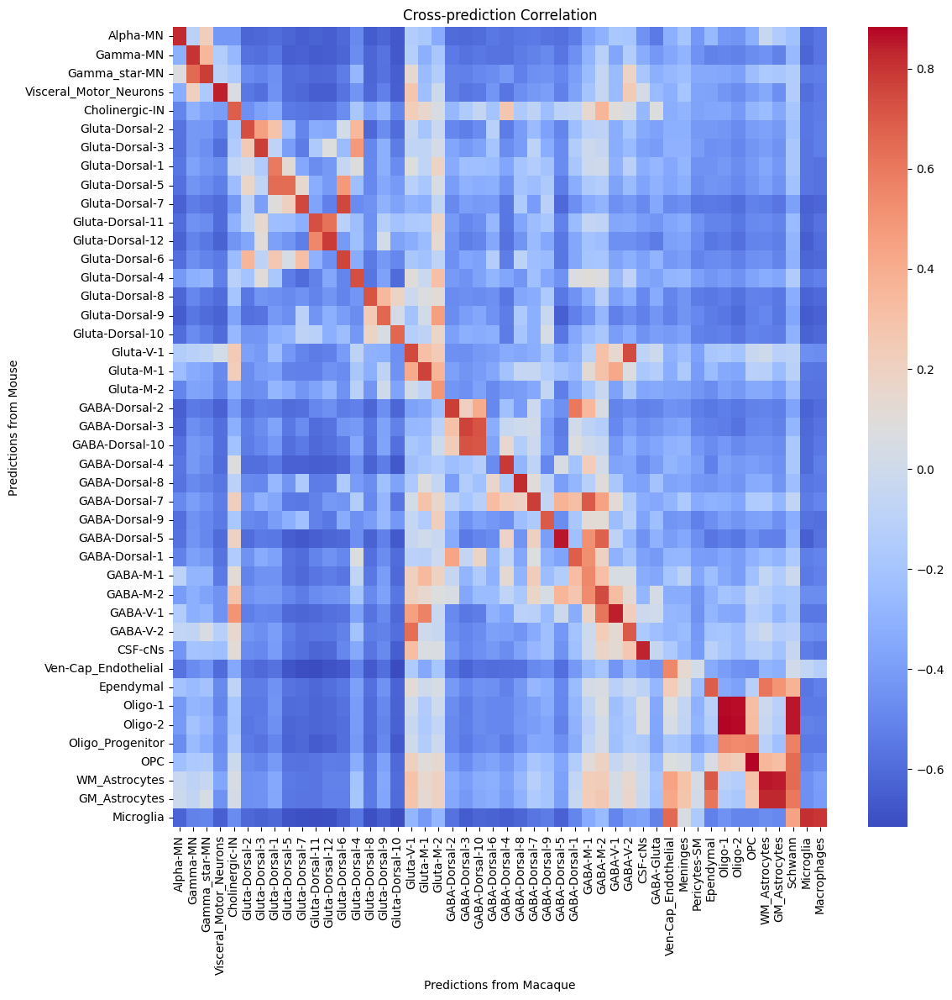

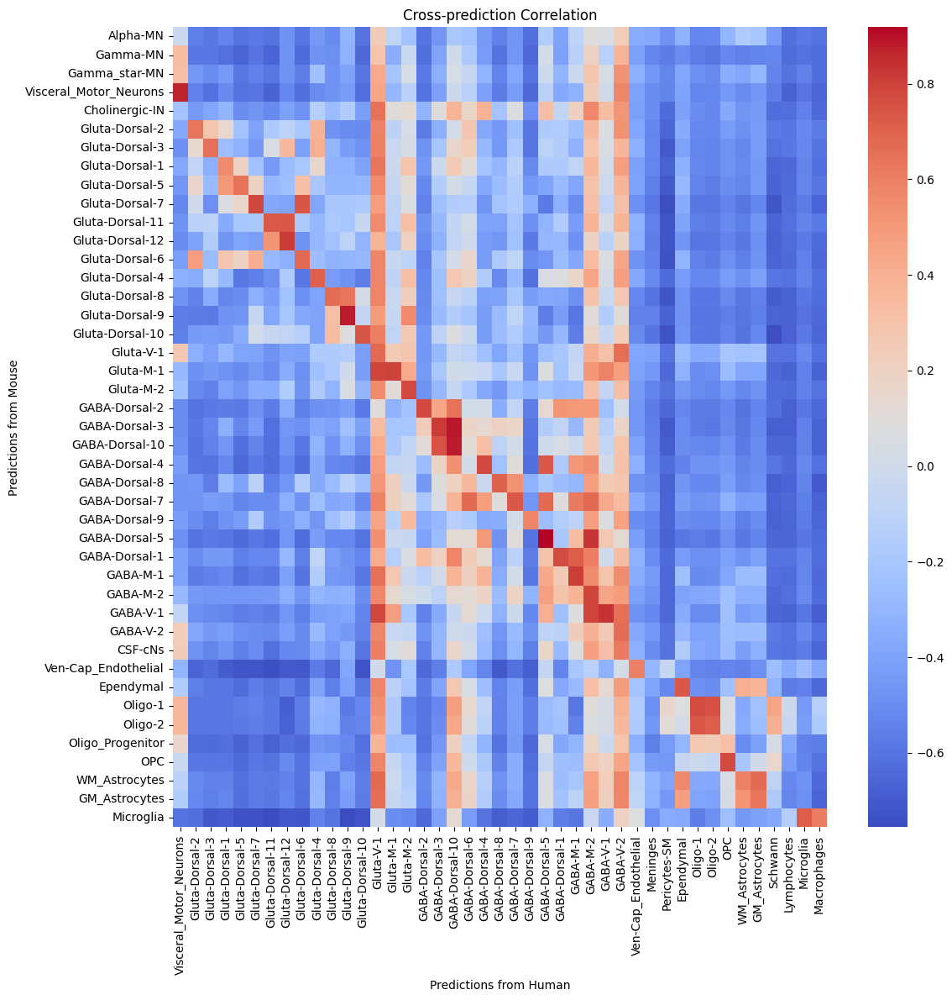

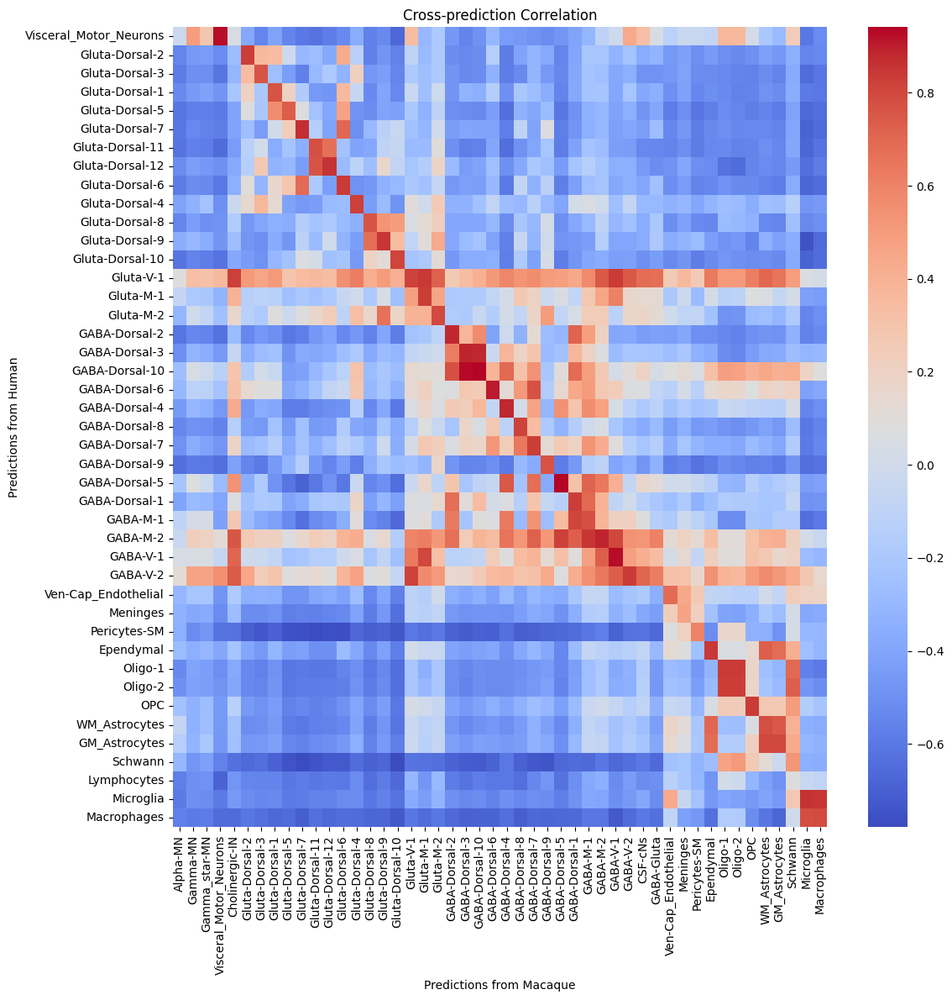

In [21]:
species_data = {
    'Mouse':   {'cross_preds': cross_preds_mouse,   'adata': adata_mouse},
    'Macaque': {'cross_preds': cross_preds_macaque, 'adata': adata_macaque},
    'Human':   {'cross_preds': cross_preds_human,   'adata': adata_human}
}

_,_, corr_combined_moma, mouse_labels, macaque_labels = compare_species_correlations(
    species_pair=['Mouse', 'Macaque'],
    reordered_classes=reordered_classes,
    species_data=species_data,
    method='spearman'
)
_,_, corr_combined_mohu, mouse_labels, human_labels=compare_species_correlations(
    species_pair=['Mouse', 'Human'],
    reordered_classes=reordered_classes,
    species_data=species_data,
    method='spearman'
)
_,_, corr_combined_huma, human_labels, macaque_labels=compare_species_correlations(
    species_pair=['Human', 'Macaque'],
    reordered_classes=reordered_classes,
    species_data=species_data,
    method='spearman'
)

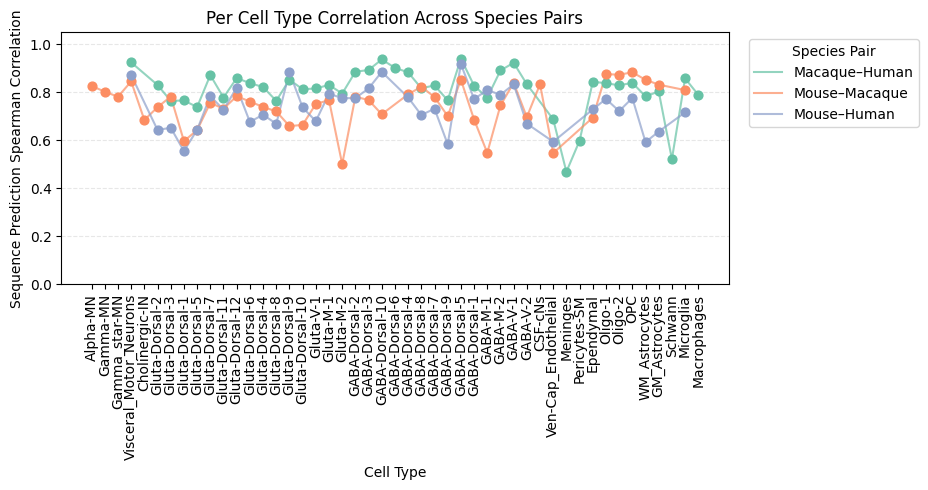

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# --- Build DataFrames from numpy arrays ---
corr_mouse_human = pd.DataFrame(corr_combined_mohu, index=mouse_labels, columns=human_labels)
corr_mouse_macaque = pd.DataFrame(corr_combined_moma, index=mouse_labels, columns=macaque_labels)
corr_macaque_human = pd.DataFrame(corr_combined_huma.T, index=macaque_labels, columns=human_labels)

# --- Melt each matrix to long form ---
def melt_corr(df, species1, species2):
    df = df.copy()
    df = df.stack().reset_index()
    df.columns = ['CellType1', 'CellType2', 'Correlation']
    df['SpeciesPair'] = f'{species1}–{species2}'
    return df

df_mm = melt_corr(corr_mouse_macaque, 'Mouse', 'Macaque')
df_mh = melt_corr(corr_mouse_human, 'Mouse', 'Human')
df_mhca = melt_corr(corr_macaque_human, 'Macaque', 'Human')

# --- Combine and filter to only matching cell types (diagonal) ---
all_corrs = pd.concat([df_mm, df_mh, df_mhca], ignore_index=True)
all_corrs = all_corrs[all_corrs['CellType1'] == all_corrs['CellType2']].copy()
all_corrs['CellType'] = all_corrs['CellType1']

# --- Set plotting order ---
species_order = ['Macaque–Human', 'Mouse–Macaque', 'Mouse–Human']
celltype_order = [ct for ct in reordered_classes if ct in all_corrs['CellType'].unique()]
all_corrs['SpeciesPair'] = pd.Categorical(all_corrs['SpeciesPair'], categories=species_order, ordered=True)
all_corrs['CellType'] = pd.Categorical(all_corrs['CellType'], categories=celltype_order, ordered=True)

# --- Prepare color palette and mapping ---
palette = sns.color_palette('Set2', n_colors=3)
species_to_color = dict(zip(species_order, palette))

# --- Begin plot ---
plt.figure(figsize=(max(6, 0.2 * len(celltype_order)), 5))

# Map cell types to numeric positions on x-axis
x_pos = np.arange(len(celltype_order))
celltype_to_x = dict(zip(celltype_order, x_pos))

# Plot line + dot per species pair
for species_pair in species_order:
    df = all_corrs[all_corrs['SpeciesPair'] == species_pair].dropna()
    df = df.sort_values('CellType')
    x = [celltype_to_x[ct] for ct in df['CellType']]
    y = df['Correlation'].values
    color = species_to_color[species_pair]
    
    # Line
    plt.plot(x, y, label=species_pair, color=color, linewidth=1.5, alpha=0.7)
    # Dots
    plt.scatter(x, y, color=color, s=40, zorder=3)

# --- Final plot aesthetics ---
plt.xticks(ticks=x_pos, labels=celltype_order, rotation=90)
plt.ylim(0, 1.05)
plt.xlabel('Cell Type')
plt.ylabel('Sequence Prediction Spearman Correlation')
plt.title('Per Cell Type Correlation Across Species Pairs')
plt.legend(title='Species Pair', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True, axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.savefig('corr.pdf', bbox_inches='tight')
plt.show()

# Validated enhancers

In [12]:
import pandas as pd
df = pd.read_csv('enh_list.csv', index_col='Plasmid ID')
df

,Project name,Cell type target class (SpC),Cell type target subclass/group (SpC),Species,Coordinates,Core,Level of labeling,Category,Note
Plasmid ID,,,,,,,,,
HCT1,Paper,Motor neuron,pan spinal motor neuron,Mouse,"chr14:32,468,473-32,469,163",NaN,5.0,NaN,yes
HCT2,NaN,Motor neuron,pan spinal motor neuron,Mouse,"chr14:32,265,147-32,265,998",NaN,5.0,NaN,yes
HCT6,NaN,Motor neuron,pan spinal motor neuron,Mouse,"chr5:104,239,701-104,240,770",NaN,5.0,NaN,yes
HCT7,NaN,Motor neuron,pan spinal motor neuron,Mouse,"chr5:104,470,842-104,471,492",NaN,3.0,NaN,ok
HCT8,NaN,Motor neuron,pan spinal motor neuron,Mouse,"chr1:187,052,314-187,053,069",NaN,3.0,NaN,yes
...,...,...,...,...,...,...,...,...,...
CN2602,NaN,Gluta,"Gluta-Dorsal-6, Gluta-Dorsal-7",Mouse,"chr14:50,995,280-50,995,748",NaN,2.0,NaN,sst/chodl (cortex)
CN3098,NaN,Astro-Ependymal,"Astrocytes, Ependymal",Human,chr6:44045591-44046117,NaN,3.0,NaN,astrocyte (cortex)
CN1852,NaN,"GABA, Gluta","GABA, Gluta",Mouse,chr1:182821907-182822681,combi,1.0,NaN,hsyn1


In [13]:
subset = ['HCT144', 'CN2251', 'CN3038','CN2631','HCT147', 'CN1390','HCT152', 'CN3575', 'CN2677', 'CN3098']

len(subset)

10

In [14]:
df = df.loc[subset]
df

,Project name,Cell type target class (SpC),Cell type target subclass/group (SpC),Species,Coordinates,Core,Level of labeling,Category,Note
Plasmid ID,,,,,,,,,
HCT144,NaN,Motor neuron,pan spinal motor neuron,Macaque,chr20:2366766-2367266,NaN,3.0,NaN,NaN
CN2251,Viruses to re-screen,"Motor neuron, Oligo","pan spinal motor neuron, Oligo, Oligo-Progenitor",Mouse,"chr4:123,946,814-123,947,465",NaN,2.0,Explainable positive,L5 ET (cortex)
CN3038,NaN,Gluta,"Gluta-Dorsal-11, Gluta-Dorsal-12",Mouse,"chr3:135,176,539-135,177,184",3x2,5.0,Explainable positive,striatal chat (cortex)
CN2631,NaN,NaN,NaN,Mouse,"chr3:135,176,539-135,177,184",NaN,5.0,NaN,striatal chat (cortex)
HCT147,NaN,Gluta,Gluta,Macaque,chr3:169653968-169654468,NaN,4.0,NaN,Ex_M1
CN1390,NaN,NaN,NaN,Human,chr7:97012097-97012227,3x,5.0,NaN,panGABAergic (cortex)
HCT152,NaN,GABA,GABA,Macaque,chr7:74595404-74595904,NaN,5.0,NaN,Good
CN3575,NaN,NaN,NaN,Mouse,chr3:125898915-125899288,3x2,4.0,NaN,oligo (cortex)
CN2677,NaN,Oligo,Oligo,Human,chr1:44592270-44592525,NaN,5.0,NaN,Astrocytes (cortex)


In [15]:
import pysam
from tqdm import tqdm

species_to_genome = {
    "Macaque": pysam.FastaFile(genome_macaque),
    "Mouse": pysam.FastaFile(genome_mouse),
    "Human": pysam.FastaFile(genome_human),
}

df = assign_sequences(
    df,
    species_to_genome=species_to_genome,
    target_length=2114,
    macaque_chrom_map=macaque_chrom_map
)


[DEBUG][HCT144] Original coords = chr20:2366766-2367266
[DEBUG][HCT144] Raw length = 500
[DEBUG][HCT144] Original padded = 2114 (L=807, R=807)
[DEBUG][HCT144] core='nan' → no bashing
[DEBUG][CN2251] Original coords = chr4:123946814-123947465
[DEBUG][CN2251] Raw length = 651
[DEBUG][CN2251] Original padded = 2114 (L=731, R=732)
[DEBUG][CN2251] core='nan' → no bashing
[DEBUG][CN3038] Original coords = chr3:135176539-135177184
[DEBUG][CN3038] Raw length = 645
[DEBUG][CN3038] Original padded = 2114 (L=734, R=735)
[DEBUG][CN3038] core='3x2': raw[198:446) len=248, repeat=3×
[DEBUG][CN3038] Core coords = chr3:135176737-135176985
[DEBUG][CN3038] After bashing unpadded len = 744
[DEBUG][CN3038] Final padded len = 2114 (L=685, R=685)
[DEBUG][CN2631] Original coords = chr3:135176539-135177184
[DEBUG][CN2631] Raw length = 645
[DEBUG][CN2631] Original padded = 2114 (L=734, R=735)
[DEBUG][CN2631] core='nan' → no bashing
[DEBUG][HCT147] Original coords = chr3:169653968-169654468
[DEBUG][HCT147] Raw l

In [16]:
%load_ext autoreload
%autoreload 2
from helper_functions import *

I0000 00:00:1754937281.997292  800947 service.cc:148] XLA service 0x7f287400c840 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1754937281.997775  800947 service.cc:156]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
2025-08-11 11:34:42.037397: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1754937282.148303  800947 cuda_dnn.cc:529] Loaded cuDNN version 90600
2025-08-11 11:34:42.668551: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 204 bytes spill stores, 204 bytes spill loads

2025-08-11 11:34:44.808524: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 52.83GiB with freed_by_count=0. The caller indicate

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


I0000 00:00:1754937286.403801  800947 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Niklas/software/HMBA_Genomics/SpinalCord/crested_analysis/helper_functions.py:318: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


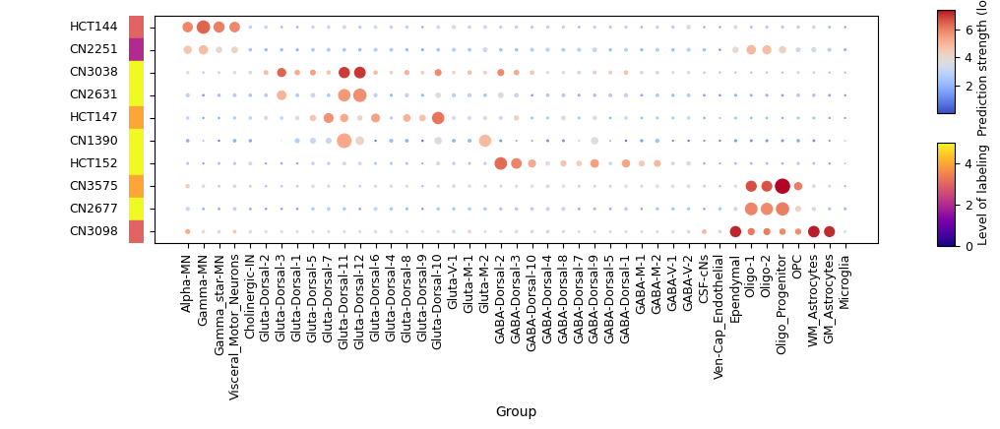

In [17]:
%matplotlib inline
prediction_specificity = crested.pp._utils._calc_proportion(crested.tl.predict(df["Sequence"].tolist(), mouse_model))
prediction_strength = np.log1p(crested.tl.predict(df["Sequence"].tolist(), mouse_model))

# Reorder using filtered class list
prediction_specificity, class_names_filtered = reorder_predictions(
    prediction_specificity, output_names_mouse, reordered_classes
)
prediction_strength, _ = reorder_predictions(
    prediction_strength, output_names_mouse, reordered_classes
)

flat_values = prediction_specificity.flatten()
#q1 = np.percentile(flat_values, 50)
#prediction_specificity[prediction_specificity<q1]=0

plot_prediction_scatter_grid(prediction_strength, prediction_specificity, df, class_names_filtered, figsize=(12,3), cmap='coolwarm', save_path='enh_preds.pdf')

2025-08-11 11:34:50.116204: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 4 bytes spill stores, 4 bytes spill loads



1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Niklas/software/HMBA_Genomics/SpinalCord/crested_analysis/helper_functions.py:318: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


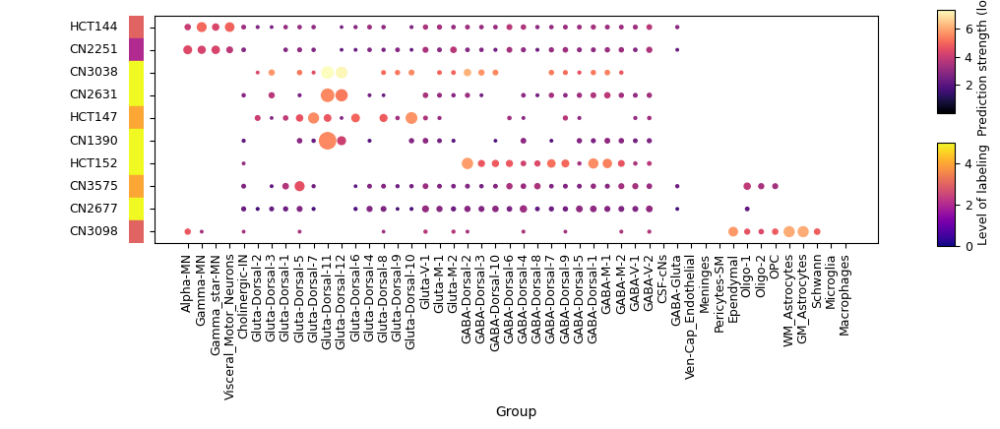

In [18]:
%matplotlib inline
prediction_specificity = crested.pp._utils._calc_proportion(crested.tl.predict(df["Sequence"].tolist(), macaque_model))
prediction_strength = np.log1p(crested.tl.predict(df["Sequence"].tolist(), macaque_model))

# Reorder using filtered class list
prediction_specificity, class_names_filtered = reorder_predictions(
    prediction_specificity, output_names_macaque, reordered_classes
)
prediction_strength, _ = reorder_predictions(
    prediction_strength, output_names_macaque, reordered_classes
)

flat_values = prediction_specificity.flatten()
q1 = np.percentile(flat_values, 50)
prediction_specificity[prediction_specificity<q1]=0

plot_prediction_scatter_grid(prediction_strength, prediction_specificity, df, class_names_filtered, figsize=(12,3))

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 958ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Niklas/software/HMBA_Genomics/SpinalCord/crested_analysis/helper_functions.py:318: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


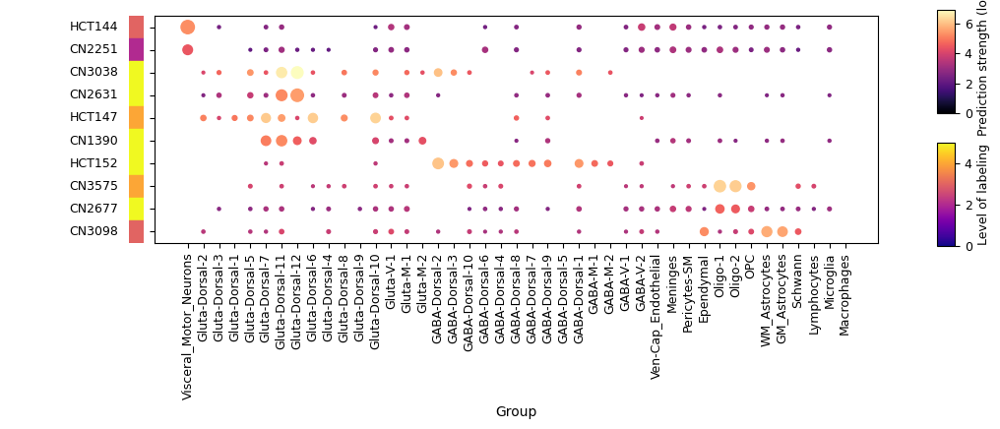

In [19]:
%matplotlib inline
prediction_specificity = crested.pp._utils._calc_proportion(crested.tl.predict(df["Sequence"].tolist(), human_model))
prediction_strength = np.log1p(crested.tl.predict(df["Sequence"].tolist(), human_model))

# Reorder using filtered class list
prediction_specificity, class_names_filtered = reorder_predictions(
    prediction_specificity, output_names_human, reordered_classes
)
prediction_strength, _ = reorder_predictions(
    prediction_strength, output_names_human, reordered_classes
)

flat_values = prediction_specificity.flatten()
q1 = np.percentile(flat_values, 50)
prediction_specificity[prediction_specificity<q1]=0

plot_prediction_scatter_grid(prediction_strength, prediction_specificity, df, class_names_filtered, figsize=(12,3))

In [20]:
model_path, output_names_biccn = crested.get_model("DeepBICCN2")
model_biccn = keras.models.load_model(model_path, compile=False)
model_path, output_names_wmb = crested.get_model("DeepMouseBrain3")
model_wmb = keras.models.load_model(model_path, compile=False)

2025-08-11 11:34:55.734192: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 196 bytes spill stores, 184 bytes spill loads

2025-08-11 11:34:56.004846: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 8 bytes spill stores, 8 bytes spill loads

2025-08-11 11:34:56.102356: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 220 bytes spill stores, 220 bytes spill loads

2025-08-11 11:34:59.078554: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 162.53GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more me

1/2 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step

2025-08-11 11:35:02.803339: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 196 bytes spill stores, 184 bytes spill loads

2025-08-11 11:35:03.247051: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 140 bytes spill stores, 140 bytes spill loads

2025-08-11 11:35:03.363634: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 8 bytes spill stores, 8 bytes spill loads

2025-08-11 11:35:04.301895: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 138.15GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more me

2/2 ━━━━━━━━━━━━━━━━━━━━ 11s 4s/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Niklas/software/HMBA_Genomics/SpinalCord/crested_analysis/helper_functions.py:318: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


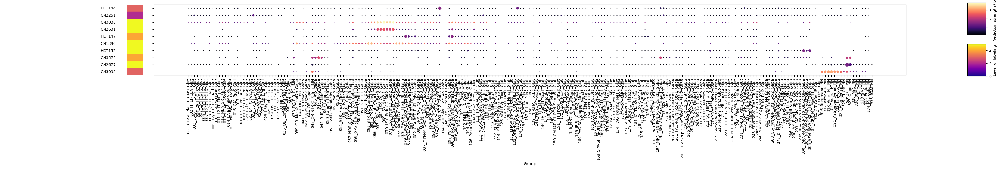

In [21]:
prediction_specificity = crested.pp._utils._calc_proportion(crested.tl.predict(df["Sequence"].tolist(), model_wmb, batch_size=8))
prediction_strength = np.log1p(crested.tl.predict(df["Sequence"].tolist(), model_wmb, batch_size=8))
flat_values = prediction_specificity.flatten()
q1 = np.percentile(flat_values, 50)
prediction_specificity[prediction_specificity<q1]=0
plot_prediction_scatter_grid(prediction_strength, prediction_specificity, df, output_names_wmb, figsize=(40,3))

## Highlighted region

In [22]:
import numpy as np
enh = 'CN3038'
enh = 'CN1457'
#enh = 'CN3189'
enh = 'CN3277'
enh='CN2631'

idx = np.argwhere(df.index==enh)[0,0]
seq = df.iloc[idx]['Sequence']
id_ = df.index[idx]
len_ = np.sum(np.array(list(seq)) != "N")
print(id_)
print(len_)

CN2631
645


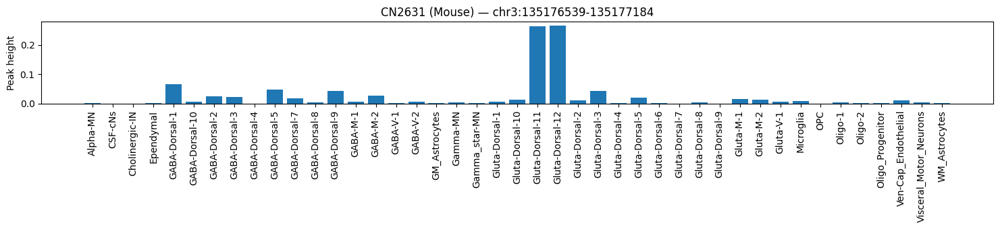

In [23]:
import os
import pyBigWig
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# === Predefined BigWig folders ===
species_folders = {
    "Mouse": "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/mouse/bigwig/",
    "Macaque": "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/macaque/bigwig/",
    "Human": "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/OCTO/aibs-octo-dnaseq-modeling/spinal_cord/data/human/bigwig/"
}

adatas = {
    "Mouse": adata_mouse,
    "Macaque": adata_macaque,
    "Human": adata_human
}

# Load and clean coordinate table
df["Core_Coordinates"] = df["Core_Coordinates"].str.replace(",", "")

# === Parse coordinate ===
row = df.iloc[idx]
species = row["Species"]
coord_str = row["Core_Coordinates"]

adata_ = adatas[species]
norm_vals = adata_.obsm['weights']
clss = np.array(adata_.obs_names)

def parse_coord(coord_str):
    chrom, rest = coord_str.split(":")
    start, end = map(int, rest.split("-"))
    return chrom, start, end

chrom, start, end = parse_coord(coord_str)

if species == 'Macaque':
    chrom = macaque_chrom_map[chrom]

# === Get folder and files ===
if species not in species_folders:
    raise ValueError(f"Species '{species}' not recognized")

bw_folder = species_folders[species]
bw_files = sorted(f for f in os.listdir(bw_folder) if f.endswith((".bw", ".bigWig")))

# === Collect values ===
values = []
labels = []

for cls in clss:
    cls = cls+'.bw'
    bw_path = os.path.join(bw_folder, cls)
    try:
        bw = pyBigWig.open(bw_path)
        signal = bw.values(chrom, start, end, numpy=True)
        total_signal = float("nan") if signal is None else np.nansum(signal)
    except RuntimeError:
        total_signal = float("nan")
    finally:
        bw.close()
    values.append(total_signal)
    labels.append(cls[:-3])

values = crested.pp._utils._calc_proportion(norm_vals * values)
# === Plot ===
plt.figure(figsize=(15, 3.5))
plt.bar(labels, values)
plt.title(f"{df.index[idx]} ({species}) — {chrom}:{start}-{end}")
plt.ylabel("Peak height")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 727ms/step


2025-08-11 11:35:17.109293: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 134.09GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


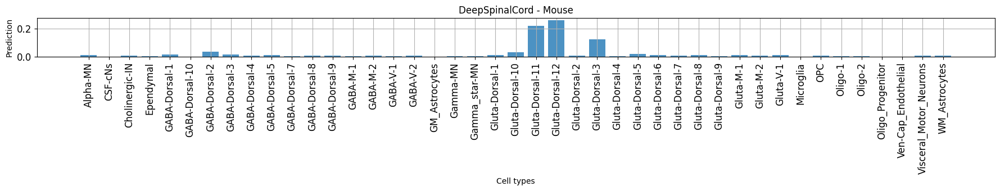

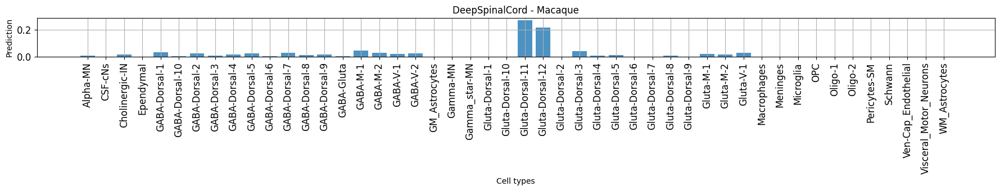

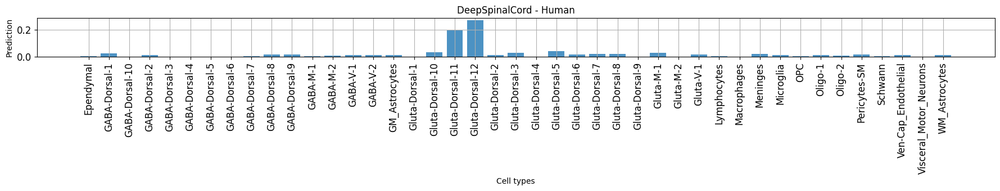

/home/niklas.kempynck/miniconda3/envs/crested_testing/lib/python3.10/site-packages/crested/pl/_utils.py:95: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


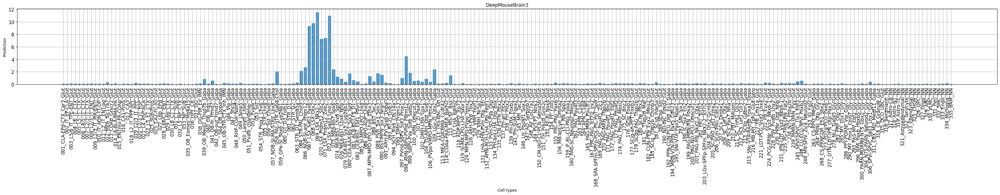

In [24]:
prediction_macaque = crested.pp._utils._calc_proportion(crested.tl.predict(seq, macaque_model))
prediction_mouse = crested.pp._utils._calc_proportion(crested.tl.predict(seq, mouse_model))
prediction_human = crested.pp._utils._calc_proportion(crested.tl.predict(seq, human_model))

prediction_wmb = crested.tl.predict(seq, model_wmb)

crested.pl.bar.prediction(prediction_mouse, classes=output_names_mouse, x_label_rotation=90, height=3.5, title='DeepSpinalCord - Mouse')
crested.pl.bar.prediction(prediction_macaque, classes=output_names_macaque, x_label_rotation=90, height=3.5, title='DeepSpinalCord - Macaque')
crested.pl.bar.prediction(prediction_human, classes=output_names_human, x_label_rotation=90, height=3.5, title='DeepSpinalCord - Human')
crested.pl.bar.prediction(prediction_wmb, classes=output_names_wmb, x_label_rotation=90, height=3.5, title='DeepMouseBrain3', width=45)

In [25]:
## Load TAC3 data
import glob
import os

expressolog_df = pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/SpinalCord/manuscript/Analysis/Expressologs/expressologs_with_metrics.csv')

expr_summary = "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/SpinalCord/manuscript/Analysis/Expressologs/"
expr_files = glob.glob(os.path.join(expr_summary, "*_group_mean_expr.h5ad"))

print(expr_files)

['/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/SpinalCord/manuscript/Analysis/Expressologs/macaque_group_mean_expr.h5ad', '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/SpinalCord/manuscript/Analysis/Expressologs/human_group_mean_expr.h5ad', '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/SpinalCord/manuscript/Analysis/Expressologs/mouse_group_mean_expr.h5ad']


In [26]:
import scanpy as sc
import pandas as pd
import numpy as np
import os

# Define species name mapping for data keys
species_map = {
    "mouse": "mouse",
    "macaque": "macaque",
    "human": "human"
}

# Load expression data from h5ad files
data = {}

for path in expr_files:
    basename = os.path.basename(path).lower()

    # Identify species from filename
    matched = [s for s in species_map if s in basename]
    if not matched:
        raise ValueError(f"Could not identify species in file: {basename}")

    species_key = species_map[matched[0]]  # lowercase: 'mouse', 'macaque', 'human'

    # Load AnnData and extract mean expression matrix
    adata = sc.read_h5ad(path)
    expr_matrix = adata.layers['mean'].T  # genes x groups

    # Convert to dense if sparse
    if not isinstance(expr_matrix, np.ndarray):
        expr_matrix = expr_matrix.toarray()

    # Build DataFrame: rows = genes, cols = groups
    df_ = pd.DataFrame(
        expr_matrix,
        index=adata.var_names,
        columns=adata.obs['Group'].values
    )

    data[species_key] = df_

# ---------------------------------------------------------------------------- #
# Load metadata

# Load cluster (group) metadata
cluster_meta = pd.read_excel(
    "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/SpinalCord/manuscript/AnnoTables/consenus_spc_metadata.xlsx"
)

# Rename for compatibility with plotting functions
cluster_meta = cluster_meta.rename(columns={'Group': 'groupby'})

# Load species-level metadata
species_meta = pd.read_excel(
    "/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/SpinalCord/manuscript/AnnoTables/consenus_spc_metadata.xlsx",
    sheet_name="species_metadata"
)

# Normalize species names to lowercase for merging consistency
species_meta['species'] = species_meta['species'].str.lower()

# Optionally set categorical order for plotting
species_order = ["human", "macaque", "mouse"]
species_meta['species'] = pd.Categorical(
    species_meta['species'],
    categories=species_order,
    ordered=True
)

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

def expresso_lines(
    gene_interest,
    data,  # dict of species → DataFrame (rows: genes, cols: groups)
    species_meta,  # DataFrame with columns: 'species', 'color'
    cluster_meta,  # DataFrame with columns: 'groupby', 'group_hierarchy_diagram_order'
    expressologs_data,  # DataFrame with 'gene', 'species1', 'rank'
    plot_width=10,
    plot_height=3,
    output_path="expressologs_lines_species_{gene}.pdf"
):
    # Combine data from all species
    df_species = []

    for species in expressologs_data['species1'].unique():
        df = data[species].copy()
        df['genes'] = df.index.str.upper().str.replace("GENE-", "", regex=False)

        if gene_interest in df['genes'].values:
            df_filtered = df[df['genes'] == gene_interest].drop(columns='genes')
            df_long = df_filtered.melt(ignore_index=False, var_name='groupby', value_name='expr')
            df_long = df_long.reset_index(drop=True)
            df_long['genes'] = gene_interest
            df_long['species'] = species
        else:
            df_long = pd.DataFrame({
                'genes': [gene_interest] * len(df.columns),
                'groupby': df.columns,
                'expr': np.nan,
                'species': species
            })

        df_species.append(df_long)

    df_species = pd.concat(df_species, ignore_index=True)

    # Compute AUROC
    unique_gene_count = expressologs_data['gene'].nunique()
    gene_rank = expressologs_data.loc[expressologs_data['gene'] == gene_interest, 'rank']
    if not gene_rank.empty:
        gene_auroc = gene_rank.iloc[0] / unique_gene_count
    else:
        gene_auroc = np.nan

    # Merge metadata
    df_merged = df_species.merge(cluster_meta, on='groupby', how='left')
    df_merged = df_merged.merge(species_meta, on='species', how='left')
    df_merged['expr'] = df_merged['expr'].fillna(0)

    cluster_order = (
        cluster_meta
        .sort_values('group_hierarchy_diagram_order')
        .drop_duplicates('groupby')  # this fixes your issue
        ['groupby']
        .tolist()
    )

    # Reorder groupby axis
    df_merged['groupby'] = pd.Categorical(
        df_merged['groupby'],
        categories=cluster_order,
        ordered=True
    )

    # Plot
    plt.figure(figsize=(plot_width, plot_height))
    sns.lineplot(
        data=df_merged,
        x='groupby',
        y='expr',
        hue='species',
        style='species',
        markers=True,
        dashes=True,
        palette=dict(zip(species_meta['species'], species_meta['color']))
    )
    plt.xticks(rotation=90)
    plt.title(f"{gene_interest}: {gene_auroc:.4f} (Conservation AUROC)")
    plt.xlabel("Group")
    plt.ylabel("Expression")
    plt.tight_layout()

    #out_file = output_path.format(gene=gene_interest)
    #Path(out_file).parent.mkdir(parents=True, exist_ok=True)
    #plt.savefig(out_file, bbox_inches='tight')
    plt.show()

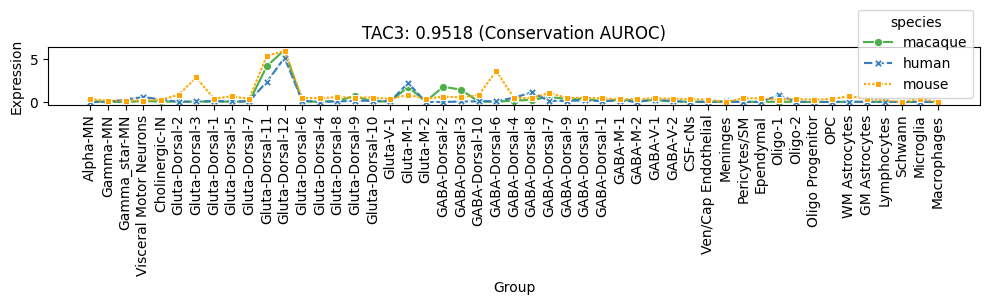

In [28]:
expresso_lines(
    'TAC3',
    data,  # dict of species → DataFrame (rows: genes, cols: groups)
    species_meta,  # DataFrame with columns: 'species', 'color'
    cluster_meta,  # DataFrame with columns: 'groupby', 'group_hierarchy_diagram_order'
    expressolog_df,  # DataFrame with 'gene', 'species1', 'rank'
    plot_width=10,
    plot_height=3,
)

In [29]:
def plot_multimodal_lineplot(
    data_frames,
    species_meta,
    reordered_classes,
    plot_width=14,
    plot_height_per_modality=2,
    output_path=None
):
    import matplotlib.pyplot as plt
    import seaborn as sns
    from matplotlib.gridspec import GridSpec

    modalities = ['scRNA', 'Pred+scATAC']
    fig = plt.figure(figsize=(plot_width, plot_height_per_modality * len(modalities)))
    gs = GridSpec(len(modalities), 1, hspace=0.05)

    species_order = list(species_meta['species'].cat.categories)
    species_palette = dict(zip(species_meta['species'], species_meta['color']))

    style_registry = {}

    # Predefine styles for species
    markers = ['s', 'o', '^']
    dashes = [(2, 2), (1, 0), (4, 2)]
    for i, species in enumerate(species_order):
        style_registry[species] = {
            'color': species_palette[species],
            'linestyle': '-',
            'marker': markers[i % len(markers)],
            'dashes': dashes[i % len(dashes)]
        }

    all_handles = {}
    for i, modality in enumerate(modalities):
        ax = fig.add_subplot(gs[i])
        df = [d for d in data_frames if d['modality'].iloc[0] == modality][0]
        # Ensure all group names are strings
        df['groupby'] = df['groupby'].astype(str)
        df['groupby'] = pd.Categorical(df['groupby'], categories=[str(g) for g in reordered_classes], ordered=True)
        df = df[df['groupby'].notna()]
        df = df.sort_values('groupby')

        for species in species_order:
            sub = df[df['species'] == species].copy()
            if not sub.empty:
                style = style_registry[species]
                x_vals = sub['groupby'].values
                # Draw the line over NaNs
                h_line, = ax.plot(
                    sub['groupby'].values,
                    sub['value'].values,
                    label=None,  # Do NOT add to legend yet
                    color=style['color'],
                    linestyle=style['linestyle'],
                    dashes=style['dashes'],
                    marker=None,
                    zorder=1
                )
                
                # Now plot only valid points with markers
                valid = sub.dropna(subset=['value'])
                h_marker = ax.plot(
                    valid['groupby'].values,
                    valid['value'].values,
                    linestyle='None',
                    marker=style['marker'],
                    color=style['color'],
                    label=species,  # Legend will now include the marker
                    zorder=2
                )[0]
                
                # Register only the marker handle for the legend
                if species not in all_handles:
                    all_handles[species] = h_marker

        # Add scATAC once
        if modality == 'Pred+scATAC' and 'scATAC' in df['species'].values:
            sub = df[df['species'] == 'scATAC']
            # Line only
            ax.plot(
                sub['groupby'],
                sub['value'],
                label=None,
                color='red',
                linestyle=':',
                marker=None,
                zorder=1
            )
            
            # Markers only at real points
            valid = sub.dropna(subset=['value'])
            h_marker = ax.plot(
                valid['groupby'],
                valid['value'],
                linestyle='None',
                marker='o',
                color='red',
                label='scATAC',
                zorder=2
            )[0]
            
            if 'scATAC' not in all_handles:
                all_handles['scATAC'] = h_marker

        ax.set_ylabel(modality)
        ax.set_xlabel("Group" if i == len(modalities) - 1 else "")
        ax.tick_params(axis='x', rotation=90)
        ax.set_title("")
        for label in ax.get_xticklabels():
            label.set_verticalalignment('top')

    from matplotlib.lines import Line2D

    # Build custom legend handles manually
    legend_handles = []
    for species in species_order:
        style = style_registry[species]
        handle = Line2D(
            [0], [0],
            color=style['color'],
            linestyle=style['linestyle'],
            marker=style['marker'],
            dashes=style['dashes'],
            label=species
        )
        legend_handles.append(handle)
    
    # Add scATAC separately
    legend_handles.append(Line2D(
        [0], [0],
        color='red',
        linestyle=':',
        marker='o',
        label='scATAC'
    ))
    
    # Draw the legend
    fig.legend(
        handles=legend_handles,
        loc='center left',
        bbox_to_anchor=(1.01, 0.5),
        borderaxespad=0,
        frameon=False
    )

    plt.tight_layout(rect=[0, 0, 0.97, 1])

    if output_path:
        from pathlib import Path
        Path(output_path).parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(output_path, bbox_inches='tight')
    else:
        plt.show()      

def prepare_predictions_with_scatac_tidy(df_all, reordered_classes):
    df_all = df_all.set_index('Class').reindex(reordered_classes).fillna(0).reset_index()
    tidy = []

    for species, col in zip(['mouse', 'macaque', 'human'], ['Mouse', 'Macaque', 'Human']):
        tidy.append(pd.DataFrame({
            'groupby': df_all['Class'],
            'species': species,
            'value': df_all[col],
            'modality': 'Pred+scATAC'
        }))

    # Add scATAC
    tidy.append(pd.DataFrame({
        'groupby': df_all['Class'],
        'species': 'scATAC',
        'value': df_all['scATAC'],
        'modality': 'Pred+scATAC'
    }))

    return pd.concat(tidy, ignore_index=True)
def prepare_scrna_tidy(data, gene_interest, cluster_meta):
    dfs = []
    for species, df in data.items():
        df = df.copy()
        df['genes'] = df.index.str.upper().str.replace("GENE-", "", regex=False)
        if gene_interest not in df['genes'].values:
            continue
        gene_expr = df[df['genes'] == gene_interest].drop(columns='genes').T
        gene_expr.columns = ['value']
        gene_expr['groupby'] = gene_expr.index
        gene_expr['species'] = species
        gene_expr['modality'] = 'scRNA'
        dfs.append(gene_expr)
    df_all = pd.concat(dfs)
    df_all = df_all.merge(cluster_meta[['groupby']], on='groupby', how='inner')
    return df_all[['groupby', 'species', 'value', 'modality']]

/home/niklas.kempynck/wandb_tmp/ipykernel_800754/2540982406.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.97, 1])


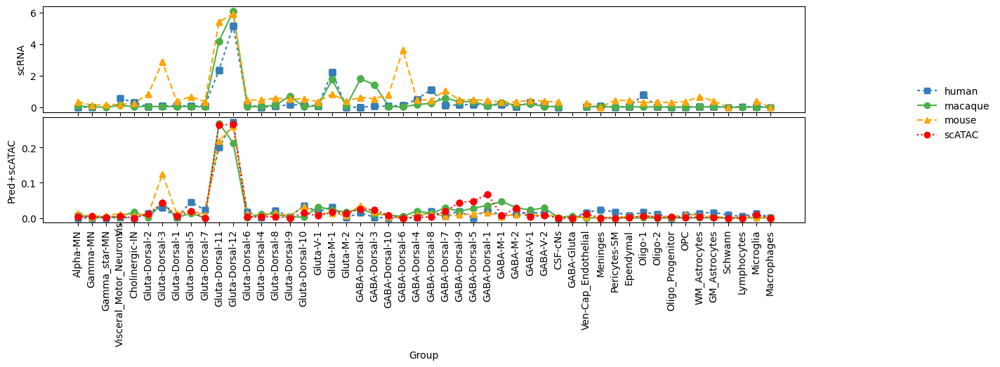

In [30]:
# Your existing df_all logic
df_atac = pd.DataFrame({'Class': output_names_mouse, 'scATAC': np.ravel(values)})
df_mouse = pd.DataFrame({'Class': output_names_mouse, 'Mouse': np.ravel(prediction_mouse)})
df_macaque = pd.DataFrame({'Class': output_names_macaque, 'Macaque': np.ravel(prediction_macaque)})
df_human = pd.DataFrame({'Class': output_names_human, 'Human': np.ravel(prediction_human)})

df_all = pd.merge(df_mouse, df_macaque, on='Class', how='outer')
df_all = pd.merge(df_all, df_human, on='Class', how='outer')
df_all = pd.merge(df_all, df_atac, on='Class', how='outer')
df_all = df_all.fillna(0)

# Prepare data
df_scrna = prepare_scrna_tidy(data, "TAC3", cluster_meta)
df_pred_scatac = prepare_predictions_with_scatac_tidy(df_all, reordered_classes)

def ensure_all_groupby(df, all_classes):
    """
    Ensure that all 'groupby' values in all_classes are present for each species+modality.
    """
    from itertools import product

    # All combinations we expect
    species_modalities = df[['species', 'modality']].drop_duplicates()
    full_index = pd.DataFrame(
        list(product(all_classes, species_modalities['species'], species_modalities['modality'])),
        columns=['groupby', 'species', 'modality']
    )

    # Merge to fill in missing groupby-species-modality with NaN values
    df_full = pd.merge(full_index, df, how='left', on=['groupby', 'species', 'modality'])

    return df_full

df_scrna['groupby'] = df_scrna['groupby'].replace({
    "GM Astrocytes": "GM_Astrocytes",
    "WM Astrocytes": "WM_Astrocytes",
    "Ven/Cap Endothelial": "Ven-Cap_Endothelial",
    "Visceral Motor Neurons": "Visceral_Motor_Neurons",
    "Oligo Progenitor": "Oligo_Progenitor", "Pericytes/SM":"Pericytes-SM",
})
df_scrna = ensure_all_groupby(df_scrna, reordered_classes)
df_pred_scatac = ensure_all_groupby(df_pred_scatac, reordered_classes)

# Plot
plot_multimodal_lineplot(
    data_frames=[df_scrna, df_pred_scatac],
    species_meta=species_meta,
    reordered_classes=reordered_classes,
    output_path='hell.pdf'
)

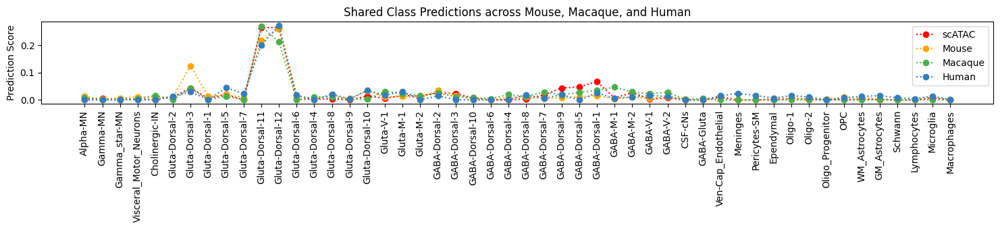

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Build per-species DataFrames
df_atac = pd.DataFrame({'Class': output_names_mouse, 'scATAC': np.ravel(values)})

df_mouse = pd.DataFrame({'Class': output_names_mouse, 'Mouse': np.ravel(prediction_mouse)})
df_macaque = pd.DataFrame({'Class': output_names_macaque, 'Macaque': np.ravel(prediction_macaque)})
df_human = pd.DataFrame({'Class': output_names_human, 'Human': np.ravel(prediction_human)})

# Merge on Class
df_all = pd.merge(df_mouse, df_macaque, on='Class', how='outer')
df_all = pd.merge(df_all, df_human, on='Class', how='outer')
df_all = pd.merge(df_all, df_atac, on='Class', how='outer')

# Fill NaN with 0
df_all = df_all.fillna(0)

# Reorder if applicable
df_all = df_all.set_index('Class').reindex(reordered_classes).fillna(0).reset_index()

# Plot as dotted line
fig, ax = plt.subplots(figsize=(max(10, 0.3 * len(df_all)), 3.5))
x = np.arange(len(df_all))

ax.plot(x, df_all['scATAC'], linestyle=':', marker='o', label='scATAC', color='red')
ax.plot(x, df_all['Mouse'], linestyle=':', marker='o', label='Mouse', color='orange')
ax.plot(x, df_all['Macaque'], linestyle=':', marker='o', label='Macaque', color='#4daf4a')
ax.plot(x, df_all['Human'], linestyle=':', marker='o', label='Human', color='#377eb8')

ax.set_xticks(x)
ax.set_xticklabels(df_all['Class'], rotation=90)
ax.set_ylabel('Prediction Score')
ax.set_title('Shared Class Predictions across Mouse, Macaque, and Human')
ax.legend()

plt.tight_layout()
plt.savefig('cn3038_preds_dotted.pdf', bbox_inches='tight')
plt.show()

In [32]:

classes_of_interest = ["Gluta-Dorsal-11"]
class_idx_mac = list(adata_macaque.obs_names.get_indexer(classes_of_interest))

regions_of_interest=[seq]
scores_mac, one_hot_encoded_sequences = crested.tl.contribution_scores(
    regions_of_interest,
    target_idx=class_idx_mac,
    model=macaque_model,
    method='integrated_grad'
)

class_idx_mou = list(adata_mouse.obs_names.get_indexer(classes_of_interest))

regions_of_interest=[seq]
scores_mou, one_hot_encoded_sequences = crested.tl.contribution_scores(
    regions_of_interest,
    target_idx=class_idx_mou,
    model=mouse_model,
    method='integrated_grad'
)

class_idx_hum = list(adata_human.obs_names.get_indexer(classes_of_interest))

regions_of_interest=[seq]
scores_hum, one_hot_encoded_sequences = crested.tl.contribution_scores(
    regions_of_interest,
    target_idx=class_idx_hum,
    model=human_model,
    method='integrated_grad'
)

2025-08-11T11:35:26.462573-0700 INFO Calculating contribution scores for 1 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:08<00:00,  8.13s/it]

2025-08-11T11:35:34.592019-0700 INFO Calculating contribution scores for 1 class(es) and 1 region(s).



Model: 100%|██████████| 1/1 [00:00<00:00, 11.46it/s]

2025-08-11T11:35:34.681377-0700 INFO Calculating contribution scores for 1 class(es) and 1 region(s).



Model: 100%|██████████| 1/1 [00:00<00:00, 12.02it/s]


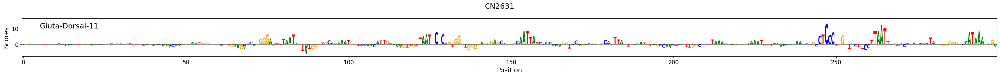

In [33]:
%matplotlib inline
crested.pl.patterns.contribution_scores(
    scores_mou,
    one_hot_encoded_sequences,
    sequence_labels=[""],
    class_labels=list(np.array(adata_mouse.obs_names)[class_idx_mou]),
    zoom_n_bases=int((len_/2.15)),
    title=id_,
    height=2.3,
    save_path='mouse_cn2631.pdf'
)  # zoom in on the center 500bp

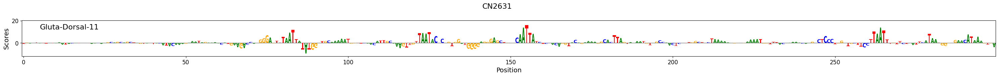

In [34]:
%matplotlib inline
crested.pl.patterns.contribution_scores(
    scores_mac,
    one_hot_encoded_sequences,
    sequence_labels=[""],
    class_labels=list(np.array(adata_macaque.obs_names)[class_idx_mac]),
    zoom_n_bases=int((len_/2.15)),
    title=id_,
    height=2.3,
    save_path='macaque_cn2631.pdf'

)  # zoom in on the center 500bp

In [35]:
np.log1p(139345)

np.float64(11.844715327797712)

In [36]:
def divisible_factors(n, k_min=-100, k_max=100):
    factors = []
    for k in range(k_min, k_max + 1):
        if k == 0:
            continue
        d = n / k
        factors.append(d)
    return sorted(set(factors))
print(divisible_factors(645, 100, 300))  # ➜ [1, 2, 3, 4, 5, 6, 10, 12, 15, 20, 30, 60]

[2.15, 2.157190635451505, 2.164429530201342, 2.1717171717171717, 2.179054054054054, 2.1864406779661016, 2.193877551020408, 2.2013651877133107, 2.208904109589041, 2.216494845360825, 2.2241379310344827, 2.2318339100346023, 2.2395833333333335, 2.2473867595818815, 2.2552447552447554, 2.263157894736842, 2.2711267605633805, 2.2791519434628977, 2.2872340425531914, 2.295373665480427, 2.3035714285714284, 2.3118279569892475, 2.320143884892086, 2.3285198555956677, 2.3369565217391304, 2.3454545454545452, 2.354014598540146, 2.3626373626373627, 2.3713235294117645, 2.3800738007380073, 2.388888888888889, 2.3977695167286246, 2.406716417910448, 2.4157303370786516, 2.424812030075188, 2.4339622641509435, 2.4431818181818183, 2.452471482889734, 2.4618320610687023, 2.471264367816092, 2.480769230769231, 2.4903474903474905, 2.5, 2.509727626459144, 2.51953125, 2.5294117647058822, 2.5393700787401574, 2.549407114624506, 2.5595238095238093, 2.5697211155378485, 2.58, 2.5903614457831323, 2.600806451612903, 2.6113360

In [37]:
len_

np.int64(645)

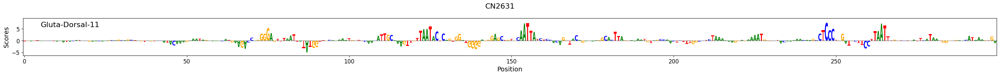

In [38]:
%matplotlib inline
crested.pl.patterns.contribution_scores(
    scores_hum,
    one_hot_encoded_sequences,
    sequence_labels=[""],
    class_labels=list(np.array(adata_human.obs_names)[class_idx_hum]),
    zoom_n_bases=int((len_/2.15)),
    title=id_,
    height=2.3,
    save_path='human_cn2631.pdf'

)  # zoom in on the center 500bp

In [39]:
classes_of_interest = ['Alpha-MN', 'CSF-cNs', 'Cholinergic-IN', 'Ependymal', 'GABA-Dorsal-1',
       'GABA-Dorsal-10', 'GABA-Dorsal-2', 'GABA-Dorsal-3', 'GABA-Dorsal-4',
       'GABA-Dorsal-5', 'GABA-Dorsal-7', 'GABA-Dorsal-8', 'GABA-Dorsal-9',
       'GABA-M-1', 'GABA-M-2', 'GABA-V-1', 'GABA-V-2', 'GM_Astrocytes',
       'Gamma-MN', 'Gamma_star-MN', 'Gluta-Dorsal-1', 'Gluta-Dorsal-10', 'Gluta-Dorsal-2',
       'Gluta-Dorsal-3', 'Gluta-Dorsal-4', 'Gluta-Dorsal-5', 'Gluta-Dorsal-6',
       'Gluta-Dorsal-7', 'Gluta-Dorsal-8', 'Gluta-Dorsal-9', 'Gluta-M-1',
       'Gluta-M-2', 'Gluta-V-1', 'Microglia', 'OPC', 'Oligo-1', 'Oligo-2',
       'Oligo_Progenitor', 'Ven-Cap_Endothelial', 'Visceral_Motor_Neurons',
       'WM_Astrocytes']
classes_of_interest = ['Gluta-Dorsal-1', 'Gluta-Dorsal-10', 'Gluta-Dorsal-2',
       'Gluta-Dorsal-3', 'Gluta-Dorsal-4', 'Gluta-Dorsal-5', 'Gluta-Dorsal-6',
       'Gluta-Dorsal-7', 'Gluta-Dorsal-8', 'Gluta-Dorsal-9']
class_idx_mou = list(adata_mouse.obs_names.get_indexer(classes_of_interest))

regions_of_interest=[seq]
scores_mou, one_hot_encoded_sequences = crested.tl.contribution_scores(
    regions_of_interest,
    target_idx=class_idx_mou,
    model=mouse_model,
    method='integrated_grad'
)

2025-08-11T11:35:42.840624-0700 INFO Calculating contribution scores for 10 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


In [40]:
adata_mouse.obs_names

Index(['Alpha-MN', 'CSF-cNs', 'Cholinergic-IN', 'Ependymal', 'GABA-Dorsal-1',
       'GABA-Dorsal-10', 'GABA-Dorsal-2', 'GABA-Dorsal-3', 'GABA-Dorsal-4',
       'GABA-Dorsal-5', 'GABA-Dorsal-7', 'GABA-Dorsal-8', 'GABA-Dorsal-9',
       'GABA-M-1', 'GABA-M-2', 'GABA-V-1', 'GABA-V-2', 'GM_Astrocytes',
       'Gamma-MN', 'Gamma_star-MN', 'Gluta-Dorsal-1', 'Gluta-Dorsal-10',
       'Gluta-Dorsal-11', 'Gluta-Dorsal-12', 'Gluta-Dorsal-2',
       'Gluta-Dorsal-3', 'Gluta-Dorsal-4', 'Gluta-Dorsal-5', 'Gluta-Dorsal-6',
       'Gluta-Dorsal-7', 'Gluta-Dorsal-8', 'Gluta-Dorsal-9', 'Gluta-M-1',
       'Gluta-M-2', 'Gluta-V-1', 'Microglia', 'OPC', 'Oligo-1', 'Oligo-2',
       'Oligo_Progenitor', 'Ven-Cap_Endothelial', 'Visceral_Motor_Neurons',
       'WM_Astrocytes'],
      dtype='object')

In [41]:
scores_mou.shape

(1, 10, 2114, 4)

In [42]:
import numpy as np

# scores_mou.shape == (1, 10, 2114, 4)

abs_scores = np.abs(scores_mou)

max_abs_idx = abs_scores.argmax(axis=1)  # shape: (1, 2114, 4)
indices = np.expand_dims(max_abs_idx, axis=1)  # shape: (1, 1, 2114, 4)
max_vals = np.take_along_axis(scores_mou, indices, axis=1)  # shape: (1, 1, 2114, 4)

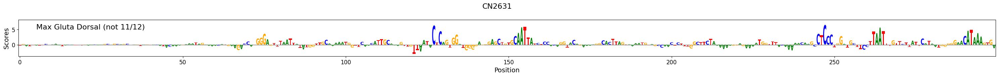

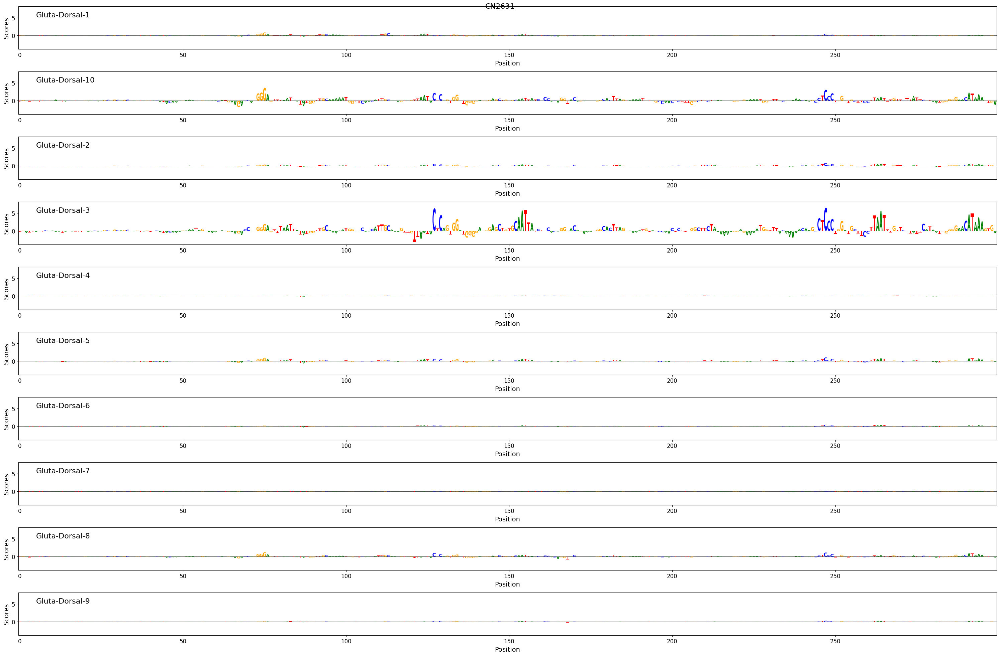

In [43]:
crested.pl.patterns.contribution_scores(
    max_vals,
    one_hot_encoded_sequences,
    sequence_labels=[""],
    class_labels=["Max Gluta Dorsal (not 11/12)"],
    zoom_n_bases=int((len_/2.15)),
    title=id_,
    height=2.3,
    save_path='mouse_cn2631_max_no11-12.pdf'
)

crested.pl.patterns.contribution_scores(
    scores_mou,
    one_hot_encoded_sequences,
    sequence_labels=[""],
    class_labels=list(np.array(adata_mouse.obs_names)[class_idx_mou]),
    zoom_n_bases=int((len_/2.15)),
    title=id_,
)  # zoom in on the center 500bp

## A deep dive into CN2631

In [44]:
import numpy as np
enh = 'CN3038'
enh = 'CN1457'
#enh = 'CN3189'
enh = 'CN3277'
enh='CN2631'

idx = np.argwhere(df.index==enh)[0,0]
seq = df.iloc[idx]['Sequence']
id_ = df.index[idx]
len_ = np.sum(np.array(list(seq)) != "N")
print(id_)
print(len_)

CN2631
645


In [45]:
seq

'NNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNTAGATTTCAACTAAATACTTTTAATCATGCAATTCCAATAGCACTTAAATTTTTTCAAGGCATGTATAAAGGGAGAATAGACTAATTCAATTTCAAAGTGCAAGAAAAACATCAAAAACTAAATTCAGAAAGTTTGCATGGGAAGAAAAAAAAACACAAATTAATCTCACTTGTGATTATTCTAAATACATTTGAACAAGCAGCAGCTAGTAGTACATACAAAGAAATAGAAAACATGAAGACCAGGGGAGTTTAATTATATGGT

In [46]:
original_prediction = crested.tl.predict(seq, mouse_model)[0]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


### Single variant effects

In [47]:
import numpy as np
from crested.utils._seq_utils import (
    one_hot_encode_sequence,
    generate_mutagenesis,
    hot_encoding_to_sequence
)
from crested.pp._utils import _calc_proportion
import crested.pl.patterns as plt_patterns


def compute_mutagenesis_contributions(
    seq: str,
    models: list,
    adatas: list,
    subset_class_names: list[str],
    proportion_class_names: list[str] | None = None,
    center_len: int = 645,
    visualize: bool = True,
) -> dict:
    """
    Compute mutagenesis contribution scores for a given sequence across multiple models.

    Parameters
    ----------
    seq : str
        DNA sequence (A/C/G/T only).
    models : list
        List of trained Keras models.
    adatas : list
        List of Anndata objects corresponding to the models. Each adata.obs_names must match model output classes.
    subset_class_names : list[str]
        Class names to include in the output and visualization.
    center_len : int
        Length of the center region to mutate.
    visualize : bool
        If True, generates contribution score plots.

    Returns
    -------
    dict
        {
            "per_model_raw": list of np.arrays [shape: (1, n_subset_classes, L, 4)],
            "per_model_prop": list of np.arrays [same shape],
            "average_raw": np.array [shape: (1, n_subset_classes, L, 4)],
            "average_prop": np.array [shape: (1, n_subset_classes, L, 4)],
            "class_labels": list of str
        }
    """
    assert len(models) == len(adatas), "One adata per model required"

    # One-hot encode input
    x = one_hot_encode_sequence(seq)
    x = x[None, :, :][0]  # shape: (1, L, 4)
    L = x.shape[1]
    flank = (L - center_len) // 2
    flanks = (flank, flank)

    # Generate mutations
    mutagenized = generate_mutagenesis(x, include_original=False, flanks=flanks)

    # Track the mutations (position, from, to, base_idx)
    original_sequence = hot_encoding_to_sequence(x)
    mutated_seqs = [hot_encoding_to_sequence(m) for m in mutagenized]
    mutation_records = []
    for mut_seq in mutated_seqs:
        for i in range(flank, L - flank):
            if mut_seq[i] != original_sequence[i]:
                from_base = original_sequence[i]
                to_base = mut_seq[i]
                base_idx = "ACGT".index(to_base)
                mutation_records.append((i, from_base, to_base, base_idx))
                break

    per_model_raw = []
    per_model_prop = []
    n_mut = len(mutation_records)
    
    for model, adata in zip(models, adatas):
        full_class_labels = list(adata.obs_names)

        # Used for final output and visualization
        subset_class_indices = [full_class_labels.index(c) for c in subset_class_names]
        
        # Used for proportion calculation (may be different)
        if proportion_class_names is not None:
            proportion_class_indices = [full_class_labels.index(c) for c in proportion_class_names]
        else:
            proportion_class_indices = subset_class_indices  # fallback

        # Original prediction
        pred_orig = model.predict(x, verbose=False)[0]  # shape: (n_all_classes,)
        pred_orig_prop = _calc_proportion(pred_orig[proportion_class_indices])
        
        # Mutated predictions
        preds_mut = model.predict(mutagenized, verbose=False)  # shape: (n_mut, n_all_classes)
        preds_mut_prop = np.array([
            _calc_proportion(p[proportion_class_indices]) for p in preds_mut
        ])  # shape: (n_mut, len(proportion_class_names))
        
        # Subset both back to subset_class_indices for deltas
        delta_raw = preds_mut[:, subset_class_indices] - pred_orig[subset_class_indices]
        delta_prop = preds_mut_prop[:, [proportion_class_names.index(c) for c in subset_class_names]] - \
                     pred_orig_prop[[proportion_class_names.index(c) for c in subset_class_names]]

        # Contribution arrays
        n_classes = len(subset_class_indices)
        contrib_raw = np.zeros((1, n_classes, L, 4))
        contrib_prop = np.zeros((1, n_classes, L, 4))

        for i, (pos, _, _, base_idx) in enumerate(mutation_records):
            contrib_raw[0, :, pos, base_idx] = delta_raw[i]    
            contrib_prop[0, :, pos, base_idx] = delta_prop[i] 

        per_model_raw.append(contrib_raw)
        per_model_prop.append(contrib_prop)

    # Average over models
    avg_raw = np.mean(per_model_raw, axis=0)
    avg_prop = np.mean(per_model_prop, axis=0)

    if visualize:
        for i, label in enumerate(["Model " + str(j + 1) for j in range(len(models))]):
            plt_patterns.contribution_scores(
                scores=per_model_raw[i],
                seqs_one_hot=x,
                sequence_labels=[f"{label} (raw delta)"],
                class_labels=subset_class_names,
                method="mutagenesis",
                zoom_n_bases=int((center_len/2.15)),
                highlight_positions=[(flank, L - flank)],
            )

            plt_patterns.contribution_scores(
                scores=per_model_prop[i],
                seqs_one_hot=x,
                sequence_labels=[f"{label} (prop delta)"],
                class_labels=subset_class_names,
                method="mutagenesis",
                zoom_n_bases=int((center_len/2.15)),
                highlight_positions=[(flank, L - flank)],
            )

        plt_patterns.contribution_scores(
            scores=avg_raw,
            seqs_one_hot=x,
            sequence_labels=["Average (raw delta)"],
            class_labels=subset_class_names,
            method="mutagenesis",
            zoom_n_bases=int((center_len/2.15)),
            highlight_positions=[(flank, L - flank)],
        )

        plt_patterns.contribution_scores(
            scores=avg_prop,
            seqs_one_hot=x,
            sequence_labels=["Average (prop delta)"],
            class_labels=subset_class_names,
            method="mutagenesis",
            zoom_n_bases=int((center_len/2.15)),
            highlight_positions=[(flank, L - flank)],
        )

    return {
        "per_model_raw": per_model_raw,
        "per_model_prop": per_model_prop,
        "average_raw": avg_raw,
        "average_prop": avg_prop,
        "class_labels": subset_class_names,
        "sequence_oh":x,
    }

2025-08-11 11:36:06.315250: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 280 bytes spill stores, 280 bytes spill loads

2025-08-11 11:36:06.681616: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 4 bytes spill stores, 4 bytes spill loads

2025-08-11 11:36:09.381344: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 97.52GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2025-08-11 11:36:14.639036: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 400 bytes spill stores, 400

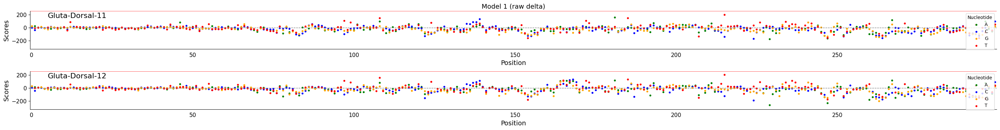

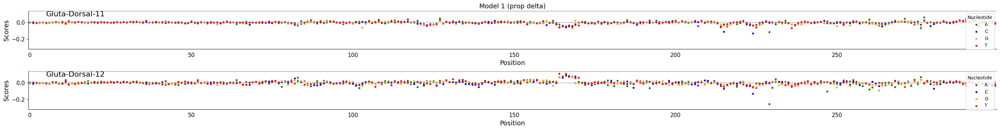

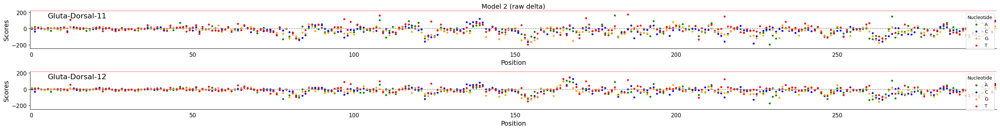

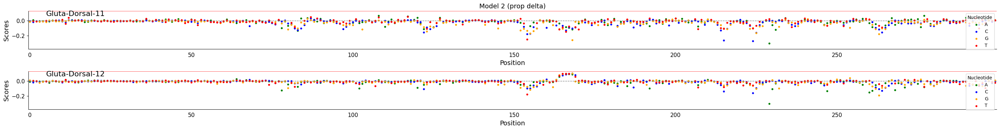

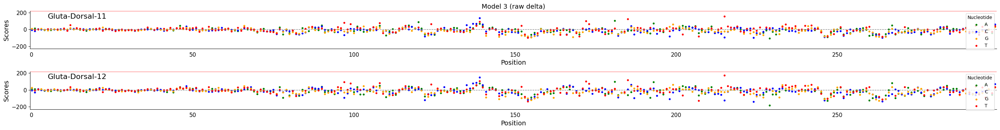

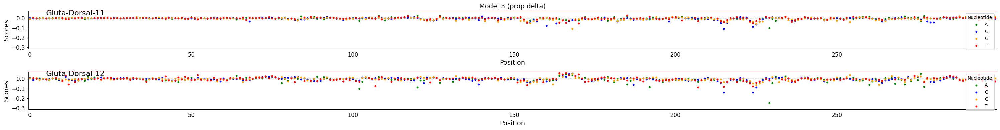

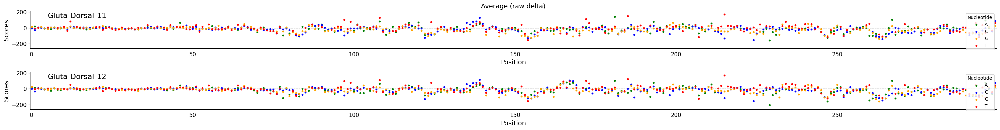

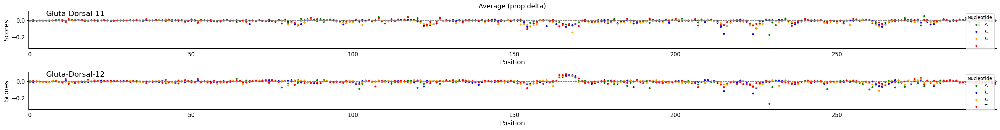

In [48]:
contribs = compute_mutagenesis_contributions(
    seq,
    models=[mouse_model, macaque_model, human_model],
    adatas=[adata_mouse, adata_macaque, adata_human],
    subset_class_names= ["Gluta-Dorsal-11", "Gluta-Dorsal-12"],
    proportion_class_names = ['Gluta-Dorsal-1', 'Gluta-Dorsal-10',"Gluta-Dorsal-11", "Gluta-Dorsal-12", 'Gluta-Dorsal-2',
       'Gluta-Dorsal-3', 'Gluta-Dorsal-4', 'Gluta-Dorsal-5', 'Gluta-Dorsal-6',
       'Gluta-Dorsal-7', 'Gluta-Dorsal-8', 'Gluta-Dorsal-9'],
    center_len= 645,
    visualize= True,
)

In [49]:
from scipy.stats import pearsonr, spearmanr
import numpy as np
import pandas as pd
from itertools import combinations


def correlation_matrix_from_contributions(contrib_list, method="pearson"):
    """
    Computes pairwise correlations (Pearson or Spearman) between flattened contribution scores of models.

    Parameters
    ----------
    contrib_list : list of np.ndarray
        Each array has shape (1, n_classes, L, 4)
    method : str
        "pearson" or "spearman"

    Returns
    -------
    pd.DataFrame
        Correlation matrix between models
    """
    # Flatten each contribution array: (1, C, L, 4) → (C * L * 4,)
    flattened = [c.reshape(-1) for c in contrib_list]

    # Names
    model_names = [f"Model_{i+1}" for i in range(len(flattened))]

    # Prepare correlation matrix
    matrix = np.zeros((len(flattened), len(flattened)))

    for i, j in combinations(range(len(flattened)), 2):
        if method == "pearson":
            r, _ = pearsonr(flattened[i], flattened[j])
        elif method == "spearman":
            r, _ = spearmanr(flattened[i], flattened[j])
        else:
            raise ValueError("method must be 'pearson' or 'spearman'")
        matrix[i, j] = matrix[j, i] = r

    # Fill diagonal
    np.fill_diagonal(matrix, 1.0)

    return pd.DataFrame(matrix, index=model_names, columns=model_names)


In [50]:
corr_df_pearson = correlation_matrix_from_contributions(contribs["per_model_prop"], method="pearson")
corr_df_spearman = correlation_matrix_from_contributions(contribs["per_model_prop"], method="spearman")

print("Pearson correlation matrix:")
print(corr_df_pearson)

print("\nSpearman correlation matrix:")
print(corr_df_spearman)

Pearson correlation matrix:
          Model_1   Model_2   Model_3
Model_1  1.000000  0.615420  0.735275
Model_2  0.615420  1.000000  0.731954
Model_3  0.735275  0.731954  1.000000

Spearman correlation matrix:
          Model_1   Model_2   Model_3
Model_1  1.000000  0.361653  0.460443
Model_2  0.361653  1.000000  0.428517
Model_3  0.460443  0.428517  1.000000


In [51]:
contribs["average_prop"].shape

(1, 2, 2114, 4)

In [52]:
# contrib_scores_prop_subset: shape (1, n_classes, L, 4)
test = contribs["average_prop"].copy()

# Step 1: Find index of nucleotide with max absolute value at each position
abs_argmax = np.abs(test).argmax(axis=3)  # shape (1, n_classes, L)

# Step 2: Gather signed max values at those positions
# Create index grid
batch_idx, class_idx, pos_idx = np.meshgrid(
    np.arange(test.shape[0]),
    np.arange(test.shape[1]),
    np.arange(test.shape[2]),
    indexing="ij"
)

# Use the indices to get the signed max values
signed_max = test[batch_idx, class_idx, pos_idx, abs_argmax]  # shape: (1, n_classes, L)

# Step 3: Broadcast to all nucleotides
signed_max_broadcasted = np.repeat(signed_max[:, :, :, None], 4, axis=3)  # shape: (1, n_classes, L, 4)


# You can now assign this to test or use it directly
test = signed_max_broadcasted
test[0,0,1001]

array([0.0077466, 0.0077466, 0.0077466, 0.0077466])

In [53]:
test.shape

(1, 2, 2114, 4)

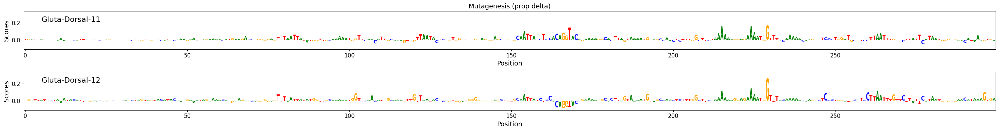

In [54]:
plt_patterns.contribution_scores(
    scores=-test,
    seqs_one_hot=contribs['sequence_oh'],
    sequence_labels=["Mutagenesis (prop delta)"],
    class_labels=["Gluta-Dorsal-11", "Gluta-Dorsal-12"],
    zoom_n_bases=int((len_/2.15)),
)


In [55]:
classes_of_interest = ["Gluta-Dorsal-11", "Gluta-Dorsal-12"]
class_idx_mou = list(adata_mouse.obs_names.get_indexer(classes_of_interest))

regions_of_interest=[seq]
scores_mou, one_hot_encoded_sequences = crested.tl.contribution_scores(
    regions_of_interest,
    target_idx=class_idx_mou,
    model=mouse_model,
    method='integrated_grad'
)


2025-08-11T11:36:35.867124-0700 INFO Calculating contribution scores for 2 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


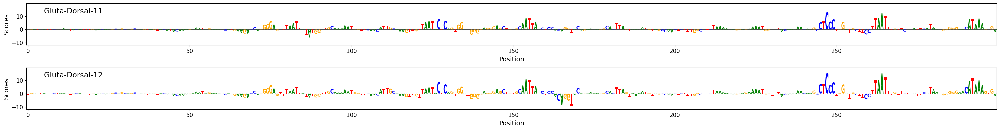

In [56]:
%matplotlib inline
crested.pl.patterns.contribution_scores(
    scores_mou,
    one_hot_encoded_sequences,
    sequence_labels=[""],
    class_labels=list(np.array(adata_mouse.obs_names)[class_idx_mou]),
    zoom_n_bases=int((len_/2.15)),
)  # zoom in on the center 500bp

### Motif effects

In [57]:
seq[736+349:736+357]


'GCACTTAG'

In [58]:
736+357

1093

In [71]:
motif_position_dict= {
    "weirdo": (1119,1135),
    "weirdo_p1":(1119, 1124),
    "weirdo_p2":(1130,1135),
    "ebf2_hoxb6_1": (976,993),
    "repr_1": (993, 1000),
    "repr_2": (1070, 1076),
    "hoxb6_1": (1028, 1034),
    "ebf2_1":(1034, 1043),
    "hoxb6_2":(1059,1066),
    "ebf2_hoxb6_2":(1151,1174),
    "ebf2_2":(1151, 1161),
    "hoxb6_3":(1168, 1174),
    "hoxb6_4":(1195,1203),
    "CATTGC" : (1015,1021),
    "GCACTTAG":(1085,1093),
    "GCAAAAAAT":(1000, 1008),
}
motif_list = [motif_position_dict[key] for key in motif_position_dict.keys()]

2025-08-11T11:55:47.723441-0700 INFO Calculating contribution scores for 2 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


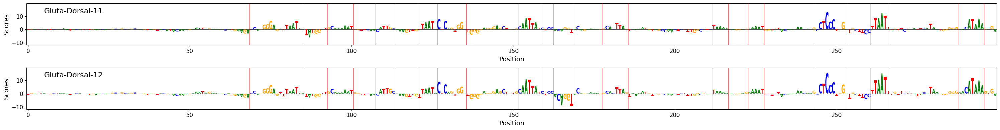

In [72]:
classes_of_interest = ["Gluta-Dorsal-11", "Gluta-Dorsal-12"]
class_idx_mou = list(adata_mouse.obs_names.get_indexer(classes_of_interest))

regions_of_interest=[seq]
scores_mou, one_hot_encoded_sequences = crested.tl.contribution_scores(
    regions_of_interest,
    target_idx=class_idx_mou,
    model=mouse_model,
    method='integrated_grad'
)
%matplotlib inline
crested.pl.patterns.contribution_scores(
    scores_mou,
    one_hot_encoded_sequences,
    sequence_labels=[""],
    class_labels=list(np.array(adata_mouse.obs_names)[class_idx_mou]),
    zoom_n_bases=int((len_/2.15)),
    highlight_positions=motif_list
)  # zoom in on the center 500bp

In [73]:
def scramble_motif_old(seq: str, start: int, end: int, n: int = 1) -> list[str]:
    """
    Scramble the motif region `n` times and return `n` sequences.

    Parameters
    ----------
    seq : str
        Full DNA sequence
    start, end : int
        Motif start and end (0-based, end exclusive)
    n : int
        Number of independent shuffles

    Returns
    -------
    list of str
        List of scrambled sequences
    """
    motif = list(seq[start:end])
    scrambled_seqs = []
    for _ in range(n):
        np.random.shuffle(motif)
        scrambled_seqs.append(seq[:start] + ''.join(motif) + seq[end:])
    return scrambled_seqs

def scramble_motif(seq: str, start: int, end: int, n: int = 1) -> list[str]:
    """
    Replace the motif region `n` times with random nucleotides and return `n` sequences.

    Parameters
    ----------
    seq : str
        Full DNA sequence
    start, end : int
        Motif start and end (0-based, end exclusive)
    n : int
        Number of independent replacements

    Returns
    -------
    list of str
        List of sequences with the motif region replaced by random A/C/G/T
    """
    motif_len = end - start
    scrambled_seqs = []
    for _ in range(n):
        random_bases = np.random.choice(['A', 'C', 'G', 'T'], size=motif_len)
        scrambled = seq[:start] + ''.join(random_bases) + seq[end:]
        scrambled_seqs.append(scrambled)
    return scrambled_seqs

def scramble_motif_ns(seq: str, start: int, end: int) -> str:
    """Replace motif in sequence between start and end with 'N's."""
    return seq[:start] + 'N' * (end - start) + seq[end:]
    
def compute_scrambling_contributions(
    seq: str,
    motif_position_dict: dict[str, tuple[int, int]],
    models: list,
    adatas: list,
    subset_class_names: list[str],
    proportion_class_names: list[str] | None = None,
    n_shuffles: int = 1,
) -> dict:
    """
    Compute motif scrambling contribution scores with optional averaging over multiple shuffles.

    Parameters
    ----------
    n_shuffles : int
        Number of independent scrambles per motif.

    Returns
    -------
    dict[str, dict] :
        {
            motif_name: {
                "delta_raw": np.array (n_models, n_subset_classes),
                "delta_prop": np.array (n_models, n_subset_classes),
                "avg_raw": np.array (n_subset_classes,),
                "avg_prop": np.array (n_subset_classes,)
            }
        }
    """
    assert len(models) == len(adatas)

    full_class_labels_list = [list(adata.obs_names) for adata in adatas]
    x = one_hot_encode_sequence(seq)

    results = {}

    for motif_name, (start, end) in motif_position_dict.items():
        # Generate multiple scrambled versions
        scrambled_seqs = scramble_motif(seq, start, end, n=n_shuffles)
        scrambled_onehots = [one_hot_encode_sequence(s) for s in scrambled_seqs]

        delta_raw_models = []
        delta_prop_models = []

        for model, full_labels in zip(models, full_class_labels_list):
            subset_class_indices = [full_labels.index(c) for c in subset_class_names]

            if proportion_class_names is not None:
                proportion_class_indices = [full_labels.index(c) for c in proportion_class_names]
                prop_to_subset = [proportion_class_names.index(c) for c in subset_class_names]
            else:
                proportion_class_indices = subset_class_indices
                prop_to_subset = list(range(len(subset_class_names)))

            pred_orig = model.predict(x, verbose=False)[0]  # shape (n_classes,)
            prop_orig = _calc_proportion(pred_orig[proportion_class_indices])

            # Average over shuffled variants
            preds_scrambled = np.array([
                model.predict(scrambled, verbose=False)[0] for scrambled in scrambled_onehots
            ])  # shape (n_shuffles, n_classes)

            props_scrambled = np.array([
                _calc_proportion(p[proportion_class_indices]) for p in preds_scrambled
            ])  # shape (n_shuffles, n_prop_classes)

            avg_scrambled = preds_scrambled.mean(axis=0)
            avg_prop_scrambled = props_scrambled.mean(axis=0)

            delta_raw = avg_scrambled[subset_class_indices] - pred_orig[subset_class_indices]
            delta_prop = avg_prop_scrambled[prop_to_subset] - prop_orig[prop_to_subset]

            delta_raw_models.append(delta_raw)
            delta_prop_models.append(delta_prop)

        delta_raw_arr = np.stack(delta_raw_models, axis=0)
        delta_prop_arr = np.stack(delta_prop_models, axis=0)

        results[motif_name] = {
            "delta_raw": delta_raw_arr,
            "delta_prop": delta_prop_arr,
            "avg_raw": delta_raw_arr.mean(axis=0),
            "avg_prop": delta_prop_arr.mean(axis=0),
        }

    return results

import pandas as pd

def summarize_scrambling_effects(
    motif_results: dict,
    class_labels: list[str],
    decimals: int = 4,
) -> pd.DataFrame:
    """
    Convert motif results into a table with average delta_raw and delta_prop per class.
    """
    rows = []
    for motif, vals in motif_results.items():
        for i, class_name in enumerate(class_labels):
            rows.append({
                "motif": motif,
                "class": class_name,
                "delta_raw": round(vals["avg_raw"][i], decimals),
                "delta_prop": round(vals["avg_prop"][i], decimals)
            })
    return pd.DataFrame(rows)

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

def plot_scrambling_effects(
    motif_results: dict,
    class_labels: list[str],
    kind: str = "prop",  # "prop" or "raw"
    figsize: tuple = (10, 5),
    title: str = "Motif scrambling effect on prediction",
    decimals: int = 4,
):
    """
    Plot average effect of scrambling each motif on model prediction or proportion.

    Parameters
    ----------
    motif_results : dict
        Output of compute_scrambling_contributions()
    class_labels : list of str
        Class names to label bars
    kind : str
        Either "raw" or "prop" to select delta type
    figsize : tuple
        Figure size
    title : str
        Plot title
    decimals : int
        Round deltas for cleaner hover / print
    """
    assert kind in {"raw", "prop"}, "kind must be 'raw' or 'prop'"

    # Flatten into dataframe
    records = []
    for motif, vals in motif_results.items():
        for i, class_name in enumerate(class_labels):
            value = vals[f"avg_{kind}"][i]
            records.append({
                "motif": motif,
                "class": class_name,
                "delta": round(value, decimals)
            })

    df = pd.DataFrame(records)

    # Plot
    g = sns.catplot(
        data=df,
        kind="bar",
        x="motif",
        y="delta",
        hue="class",
        height=figsize[1],
        aspect=figsize[0] / figsize[1],
        palette="muted"
    )
    g.set_titles(title)
    g.set_axis_labels("Motif", f"Δ prediction ({kind})")
    g.set_xticklabels(rotation=45, ha="right")
    g.fig.tight_layout()

    plt.show()

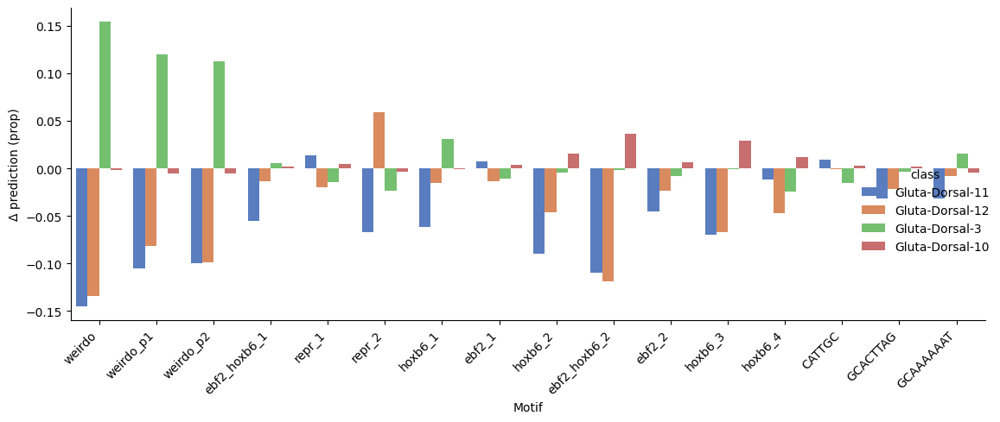

In [75]:
motif_results = compute_scrambling_contributions(
    seq=seq,
    motif_position_dict=motif_position_dict,
    models=[mouse_model, macaque_model, human_model],
    adatas=[adata_mouse, adata_macaque, adata_human],
    subset_class_names=["Gluta-Dorsal-11", "Gluta-Dorsal-12", "Gluta-Dorsal-3", "Gluta-Dorsal-10"],
    proportion_class_names=[
        'Gluta-Dorsal-1', 'Gluta-Dorsal-10', "Gluta-Dorsal-11", "Gluta-Dorsal-12",
        'Gluta-Dorsal-2', 'Gluta-Dorsal-3', 'Gluta-Dorsal-4', 'Gluta-Dorsal-5',
        'Gluta-Dorsal-6', 'Gluta-Dorsal-7', 'Gluta-Dorsal-8', 'Gluta-Dorsal-9'
    ],
    n_shuffles=20
)

summary_df = summarize_scrambling_effects(
    motif_results,
    class_labels=["Gluta-Dorsal-11", "Gluta-Dorsal-12", "Gluta-Dorsal-3", "Gluta-Dorsal-10"]
)
plot_scrambling_effects(
    motif_results=motif_results,
    class_labels=["Gluta-Dorsal-11", "Gluta-Dorsal-12", "Gluta-Dorsal-3", "Gluta-Dorsal-10"],
    kind="prop",  # or "raw"
    title="Effect of motif scrambling on proportion-normalized predictions"
)

In [63]:
import numpy as np
from crested.utils._seq_utils import one_hot_encode_sequence
import crested.pl.bar

def predict_with_motif_randomization(
    seq: str,
    model,
    motif_position_dict: dict[str, tuple[int, int]],
    destroy: list[str],
    output_names: list[str],
    n: int = 50,
    show_plots: bool = True,
    title_prefix: str = "DeepSpinalCord - Mouse"
):
    """
    Predict with motifs randomized and return average prediction over n variants.

    Parameters
    ----------
    seq : str
        Original input sequence (A/C/G/T).
    model : keras.Model
        Trained prediction model.
    motif_position_dict : dict
        Dictionary mapping motif names to (start, end) positions.
    destroy : list[str]
        List of motif names to randomize.
    output_names : list[str]
        Class labels for plotting.
    n : int
        Number of randomized replacements to generate.
    show_plots : bool
        If True, show bar plots of original and mutated predictions.
    title_prefix : str
        Title prefix for plots.

    Returns
    -------
    np.ndarray
        Averaged prediction across n randomized sequences (shape: n_classes,)
    """

    def replace_motifs_with_random(seq: str, motif_list: list[str], motif_pos_dict: dict[str, tuple[int, int]]) -> str:
        seq_chars = list(seq)
        for motif in motif_list:
            start, end = motif_pos_dict[motif]
            rand_bases = np.random.choice(['A', 'C', 'G', 'T'], size=(end - start))
            seq_chars[start:end] = rand_bases
        return ''.join(seq_chars)

    # Generate n randomized sequences
    seqs_mut = [
        replace_motifs_with_random(seq, destroy, motif_position_dict)
        for _ in range(n)
    ]

    # One-hot encode and predict
    X = np.stack([one_hot_encode_sequence(s) for s in seqs_mut])  # shape: (n, L, 4)
    X = np.squeeze(X, axis=1)

    prediction_mut = model.predict(X, verbose=False).mean(axis=0)  # shape: (n_classes,)
    prediction_orig = model.predict(one_hot_encode_sequence(seq), verbose=False)[0]

    # Plot if requested
    if show_plots:
        crested.pl.bar.prediction(
            prediction_orig,
            classes=output_names,
            x_label_rotation=90,
            height=3.5,
            title=f"{title_prefix} (original)"
        )
        crested.pl.bar.prediction(
            prediction_mut,
            classes=output_names,
            x_label_rotation=90,
            height=3.5,
            title=f"{title_prefix} (randomized {' + '.join(destroy)})"
        )

    return prediction_mut

2025-08-11 11:37:44.984984: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 400 bytes spill stores, 400 bytes spill loads

2025-08-11 11:37:45.280222: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 156 bytes spill stores, 156 bytes spill loads

2025-08-11 11:37:47.068307: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 69.08GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


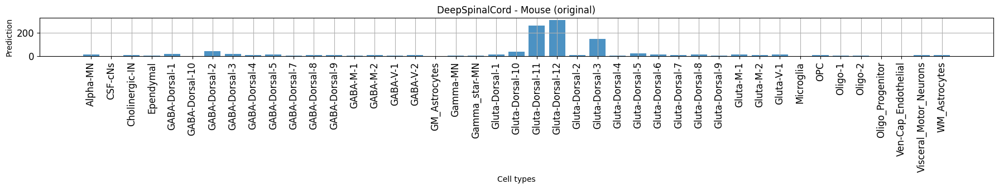

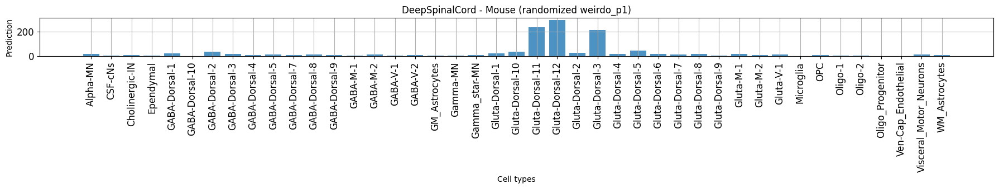

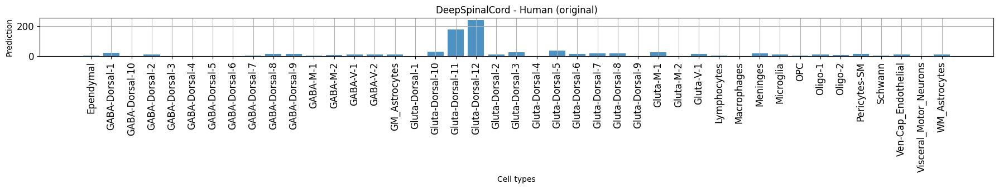

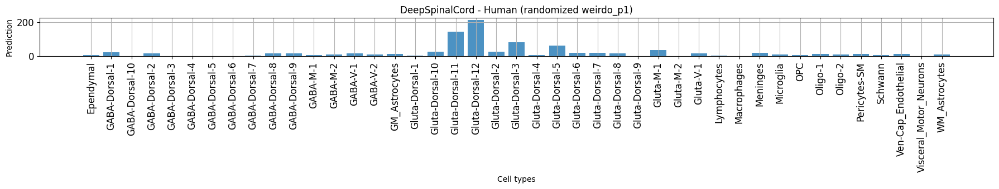

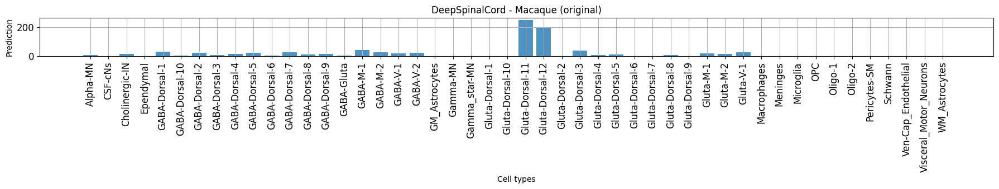

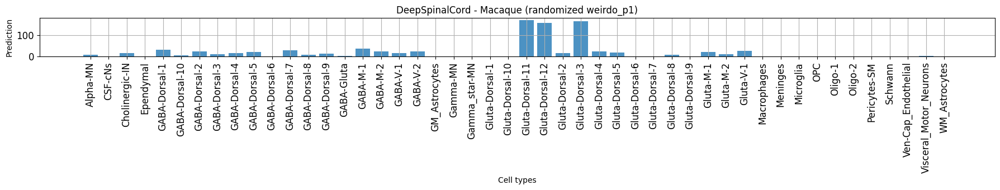

In [64]:
destroy = [
 #'weirdo',
 'weirdo_p1',
 #'weirdo_p2',
 #'ebf2_hoxb6_1',
 #'repr_1',
 #'hoxb6_1',
 #'ebf2_1',
 #'hoxb6_2',
 #'ebf2_hoxb6_2',
 #'ebf2_2',
 #'hoxb6_3',
 #'hoxb6_4',
 #'CATTGC',
 #'GCACTTAG',
 #'GCAAAAAAT'
]
prediction_mouse_mut = predict_with_motif_randomization(
    seq=seq,
    model=mouse_model,
    motif_position_dict=motif_position_dict,
    destroy=destroy,
    output_names=output_names_mouse,
    n=50,
    show_plots=True,
    title_prefix="DeepSpinalCord - Mouse"
)
prediction_human_mut = predict_with_motif_randomization(
    seq=seq,
    model=human_model,
    motif_position_dict=motif_position_dict,
    destroy=destroy,
    output_names=output_names_human,
    n=50,
    show_plots=True,
    title_prefix="DeepSpinalCord - Human"
)
prediction_macaque_mut = predict_with_motif_randomization(
    seq=seq,
    model=macaque_model,
    motif_position_dict=motif_position_dict,
    destroy=destroy,
    output_names=output_names_macaque,
    n=50,
    show_plots=True,
    title_prefix="DeepSpinalCord - Macaque"
)

In [65]:
list(motif_position_dict.keys())

['weirdo',
 'weirdo_p1',
 'weirdo_p2',
 'ebf2_hoxb6_1',
 'repr_1',
 'hoxb6_1',
 'ebf2_1',
 'hoxb6_2',
 'ebf2_hoxb6_2',
 'ebf2_2',
 'hoxb6_3',
 'hoxb6_4',
 'CATTGC',
 'GCACTTAG',
 'GCAAAAAAT']

In [66]:
import numpy as np
from crested.utils._seq_utils import one_hot_encode_sequence
import crested.pl.bar

def predict_with_background_reshuffling(
    seq: str,
    model,
    motif_position_dict: dict[str, tuple[int, int]],
    keep: list[str],
    output_names: list[str],
    n: int = 50,
    center_len: int = 645,
    show_plots: bool = True,
    title_prefix: str = "DeepSpinalCord - Mouse"
):
    """
    Predict after reshuffling background (center region) while preserving specified motifs.

    Parameters
    ----------
    seq : str
        Full sequence (2114 bp), N-flanked.
    model : keras.Model
        Model for prediction.
    motif_position_dict : dict
        Mapping from motif name to (start, end) tuple.
    keep : list[str]
        Motifs to preserve (others are shuffled).
    output_names : list[str]
        Class names for output.
    n : int
        Number of random reshufflings.
    center_len : int
        Length of central (non-N) region.
    show_plots : bool
        Whether to show bar plots.
    title_prefix : str
        Title prefix for plots.

    Returns
    -------
    prediction_mut : np.ndarray
        Average prediction after reshuffling (shape: n_classes,)
    seqs_mut : list[str]
        List of reshuffled sequences.
    """
    flank = (len(seq) - center_len) // 2
    center_start = flank
    center_end = flank + center_len
    center_seq = list(seq[center_start:center_end])

    # Mask for preserved positions
    keep_mask = np.zeros(center_len, dtype=bool)
    for motif in keep:
        start, end = motif_position_dict[motif]
        keep_mask[start - center_start:end - center_start] = True

    # Get original full sequence as list
    seq_chars = list(seq)

    # Extract background to be shuffled
    background = [base for i, base in enumerate(center_seq) if not keep_mask[i]]

    # Generate reshuffled sequences
    seqs_mut = []
    for _ in range(n):
        shuffled = background.copy()
        np.random.shuffle(shuffled)

        reshuffled_seq = center_seq.copy()
        shuffle_idx = 0
        for i in range(center_len):
            if not keep_mask[i]:
                reshuffled_seq[i] = shuffled[shuffle_idx]
                shuffle_idx += 1

        full_seq = seq_chars[:center_start] + reshuffled_seq + seq_chars[center_end:]
        seqs_mut.append(''.join(full_seq))

    # One-hot encode and predict
    X = np.stack([one_hot_encode_sequence(s) for s in seqs_mut])
    X = np.squeeze(X, axis=1)

    prediction_mut = model.predict(X, verbose=False).mean(axis=0)
    prediction_orig = model.predict(one_hot_encode_sequence(seq), verbose=False)[0]

    if show_plots:
        crested.pl.bar.prediction(
            prediction_orig,
            classes=output_names,
            x_label_rotation=90,
            height=3.5,
            title=f"{title_prefix} (original)"
        )
        crested.pl.bar.prediction(
            prediction_mut,
            classes=output_names,
            x_label_rotation=90,
            height=3.5,
            title=f"{title_prefix} (background reshuffled; kept: {' + '.join(keep)})"
        )

    return prediction_mut, seqs_mut

2025-08-11 11:37:55.156909: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 204 bytes spill stores, 204 bytes spill loads

2025-08-11 11:37:56.028374: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:306] Allocator (GPU_0_bfc) ran out of memory trying to allocate 40.64GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


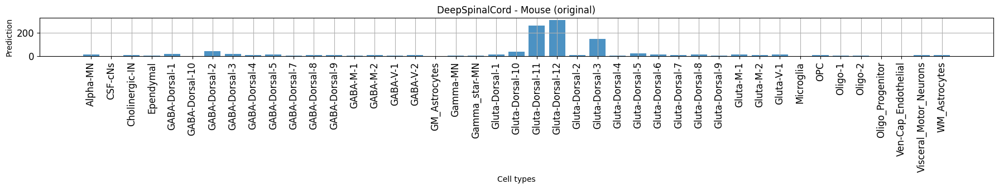

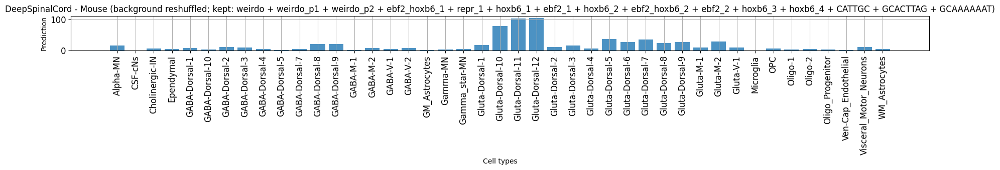

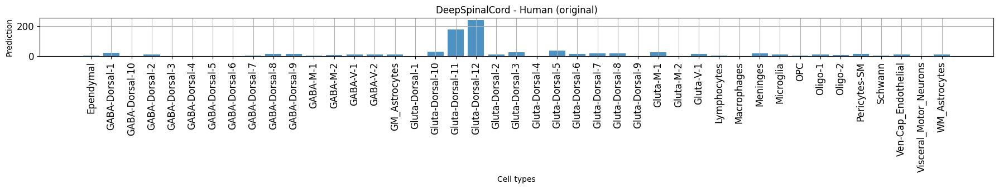

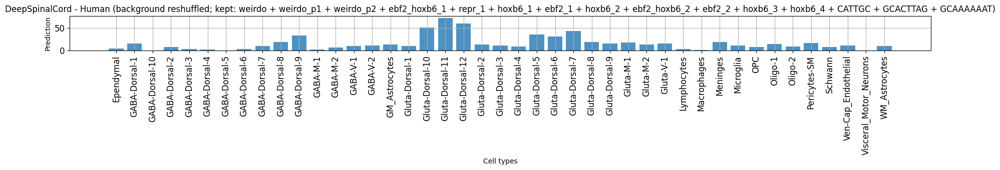

2025-08-11 11:38:00.071994: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_369', 4 bytes spill stores, 4 bytes spill loads



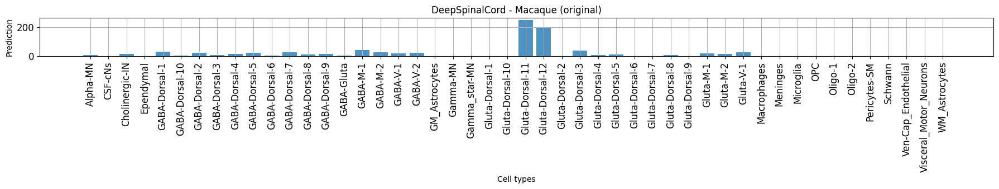

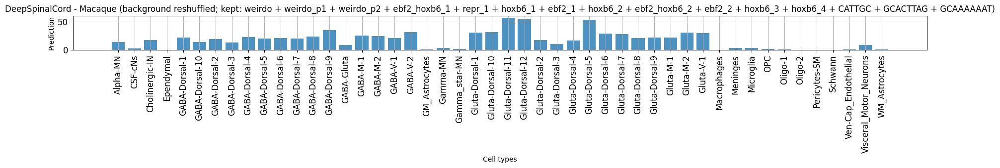

In [67]:
keep= [
 'weirdo',
 'weirdo_p1',
 'weirdo_p2',
 'ebf2_hoxb6_1',
 'repr_1',
 'hoxb6_1',
 'ebf2_1',
 'hoxb6_2',
 'ebf2_hoxb6_2',
 'ebf2_2',
 'hoxb6_3',
 'hoxb6_4',
 'CATTGC',
 'GCACTTAG',
 'GCAAAAAAT']

prediction_mouse_mut, seqs_mut = predict_with_background_reshuffling(
    seq=seq,
    model=mouse_model,
    motif_position_dict=motif_position_dict,
    keep=keep,
    output_names=output_names_mouse,
    n=100,
    title_prefix="DeepSpinalCord - Mouse",
    show_plots=True
)
prediction_mouse_mut, seqs_mut = predict_with_background_reshuffling(
    seq=seq,
    model=human_model,
    motif_position_dict=motif_position_dict,
    keep=keep,
    output_names=output_names_human,
    n=100,
    title_prefix="DeepSpinalCord - Human",
    show_plots=True
)
prediction_mouse_mut, seqs_mut = predict_with_background_reshuffling(
    seq=seq,
    model=macaque_model,
    motif_position_dict=motif_position_dict,
    keep=keep,
    output_names=output_names_macaque,
    n=100,
    title_prefix="DeepSpinalCord - Macaque",
    show_plots=True
)

2025-08-11T11:38:01.572324-0700 INFO Calculating contribution scores for 2 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


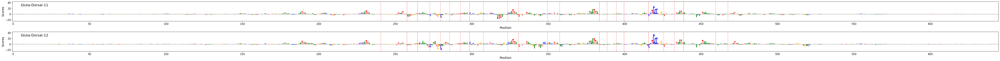

In [68]:
classes_of_interest = ["Gluta-Dorsal-11", "Gluta-Dorsal-12"]
class_idx_mou = list(adata_mouse.obs_names.get_indexer(classes_of_interest))

regions_of_interest=[seqs_mut[2]]
scores_mou, one_hot_encoded_sequences = crested.tl.contribution_scores(
    regions_of_interest,
    target_idx=class_idx_mou,
    model=mouse_model,
    method='integrated_grad'
)
%matplotlib inline
crested.pl.patterns.contribution_scores(
    scores_mou,
    one_hot_encoded_sequences,
    sequence_labels=[""],
    class_labels=list(np.array(adata_mouse.obs_names)[class_idx_mou]),
    zoom_n_bases=len_,
    highlight_positions=motif_list
)  # zoom in on the center 500bp

In [69]:
seqs_mut[0]

'NNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNNCTGATAAAGGAGACACAGTAAGGCTGTCAATTAATGCAGAAATTTGCCTTTGTCGAAAACAAGTTCAGGGTATACAGTGCTATATCGACAGTGAAAAGGTAAACCGCGTAACTGTCTGTCGTAAAAGGGTAAACCATATACTGGAAGAACTGCATTCAGAGAGCTCCGTTTAGAAACTGAATGCCTATAAAAATTTATGCTGCTGAATGACCTCTGTTTGGTTTATCAAAAATTGAACCACTCCAGGGGAGTTTAATTATATGGT